In [2]:
import os
import nilearn
import nibabel as nib
import matplotlib.pyplot as plt
from nilearn import plotting
import numpy as np
from nilearn.image import resample_img
from nilearn import masking
    from nilearn.image import new_img_like

import numpy as np
from scipy import stats
from statsmodels.stats.multitest import multipletests
from statsmodels.stats.multitest import fdrcorrection
import statsmodels.api as sm
from scipy.stats import t

import seaborn as sns

Mask

In [3]:
maskDir = 'F:\yujun\projects\data\masks'
maskFile = os.path.join(maskDir, 'MNI152_T1_2mm_brain_mask.nii.gz')
mask = nib.load(maskFile)

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_stat_map.py:219: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  bg_img = load_mni152_template()
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:274: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



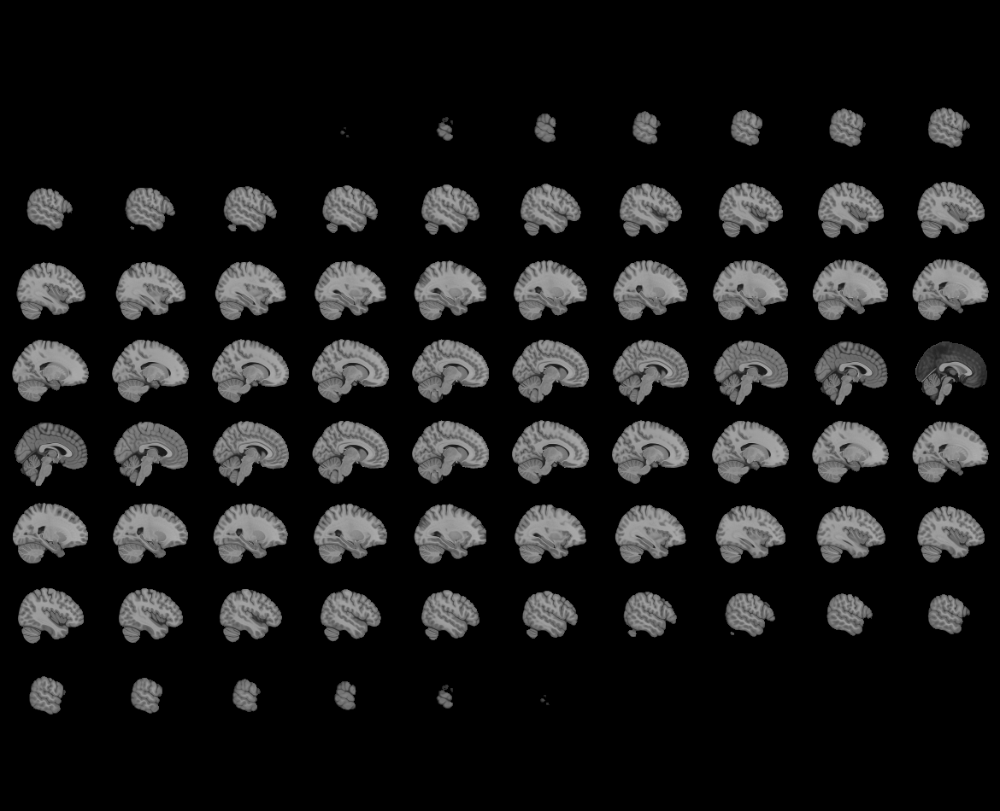
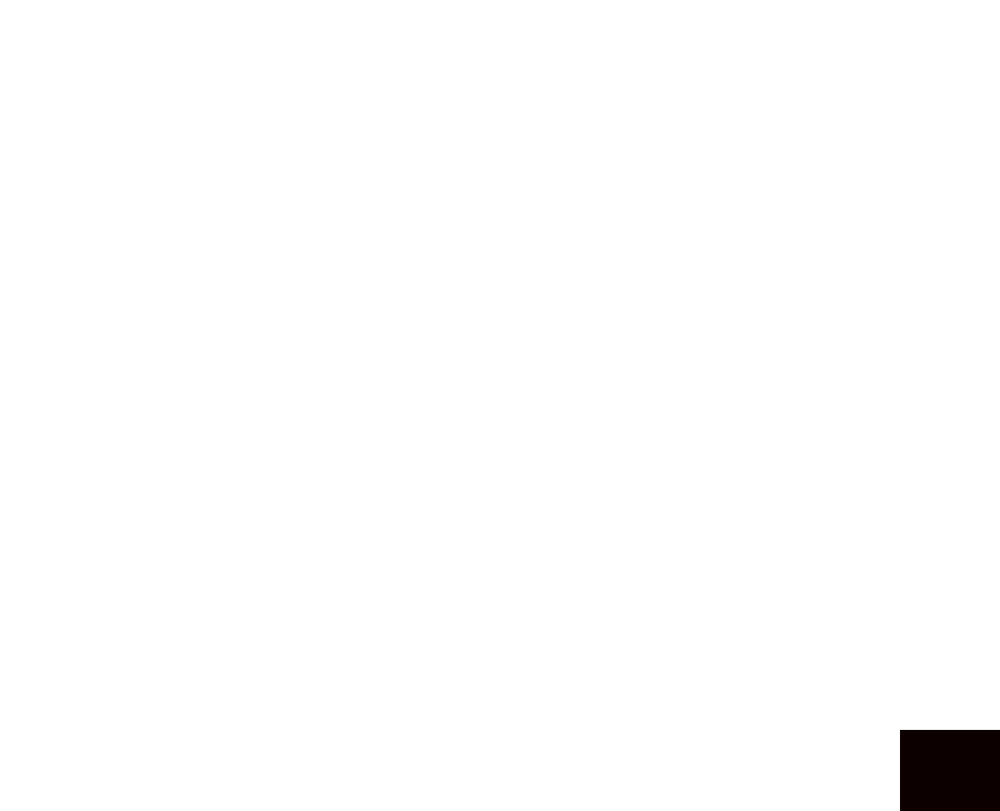

In [4]:
view = plotting.view_img(mask)
view

Peek Contrast coefficient 

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



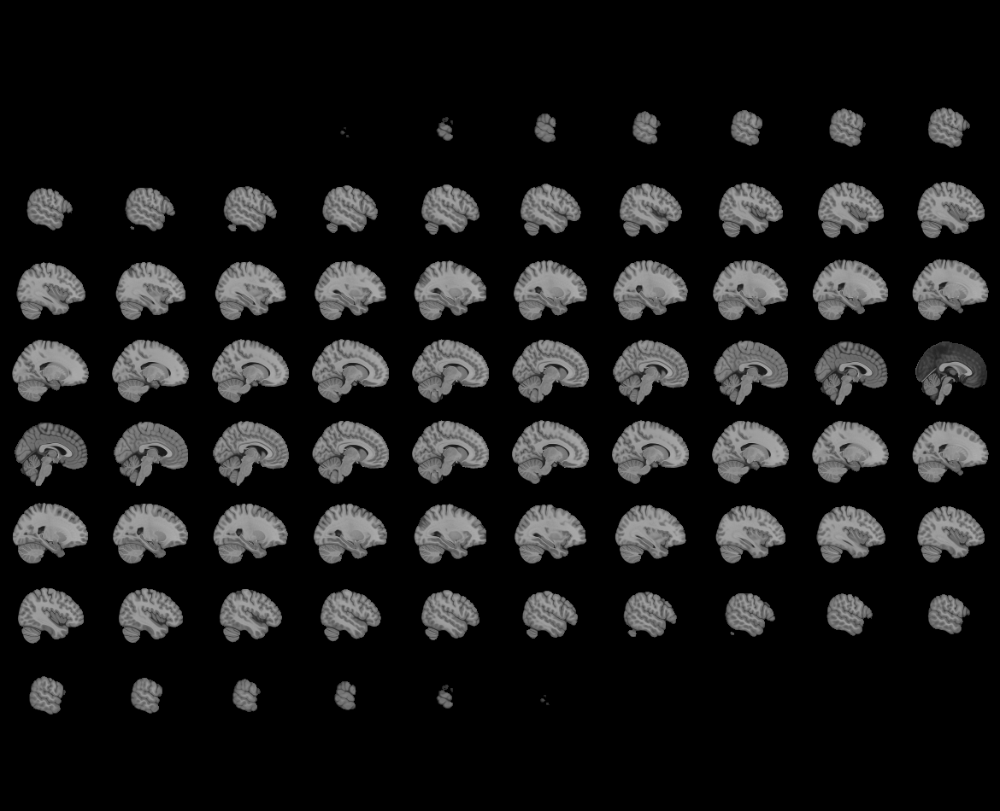
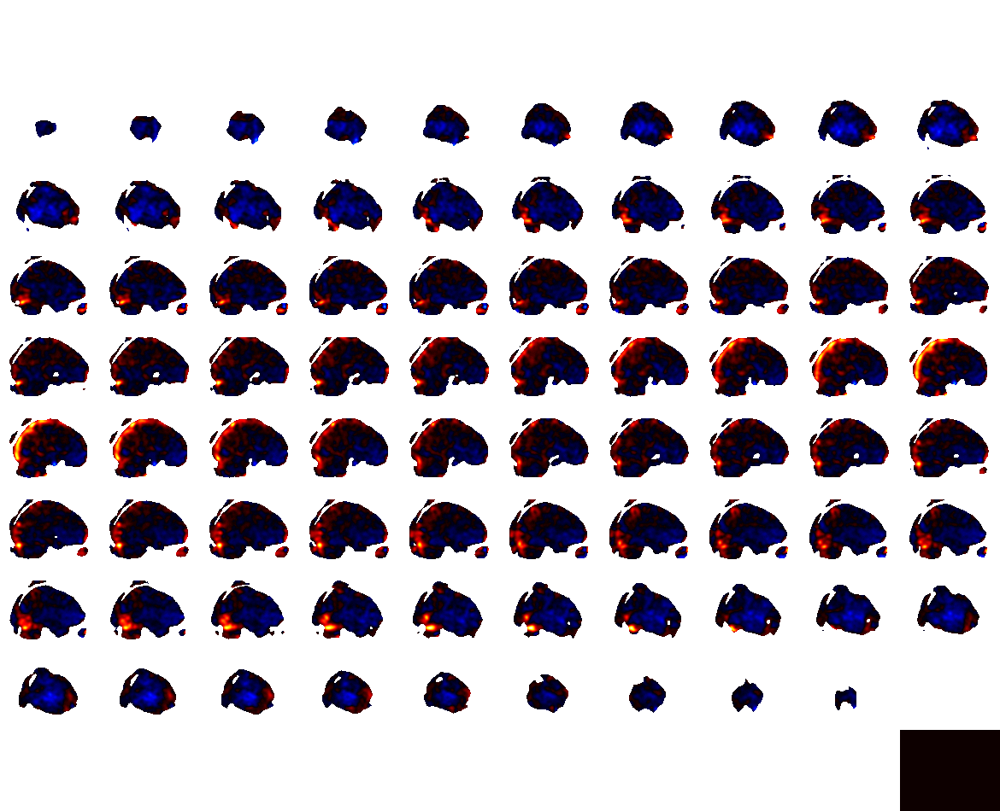

In [4]:
dataDir = '../GLM/betas/'
subs = os.listdir(dataDir)
sub = 2
beta = 4
# 1, 'Pl-AI_Pl'
# 2, 'Nt-AI_Nt'
# 3, 'Up-AI_Up'
# 4, 'Pl-Nt'
# 5, 'Pl-Up'
# 6, 'Nt-Up'
niifilename = f'con_000{beta}.nii'
niifile = os.path.join(dataDir, subs[sub-1],niifilename)
nii_file = nib.load(niifile)
view = plotting.view_img(nii_file)
view

Peek T-test

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



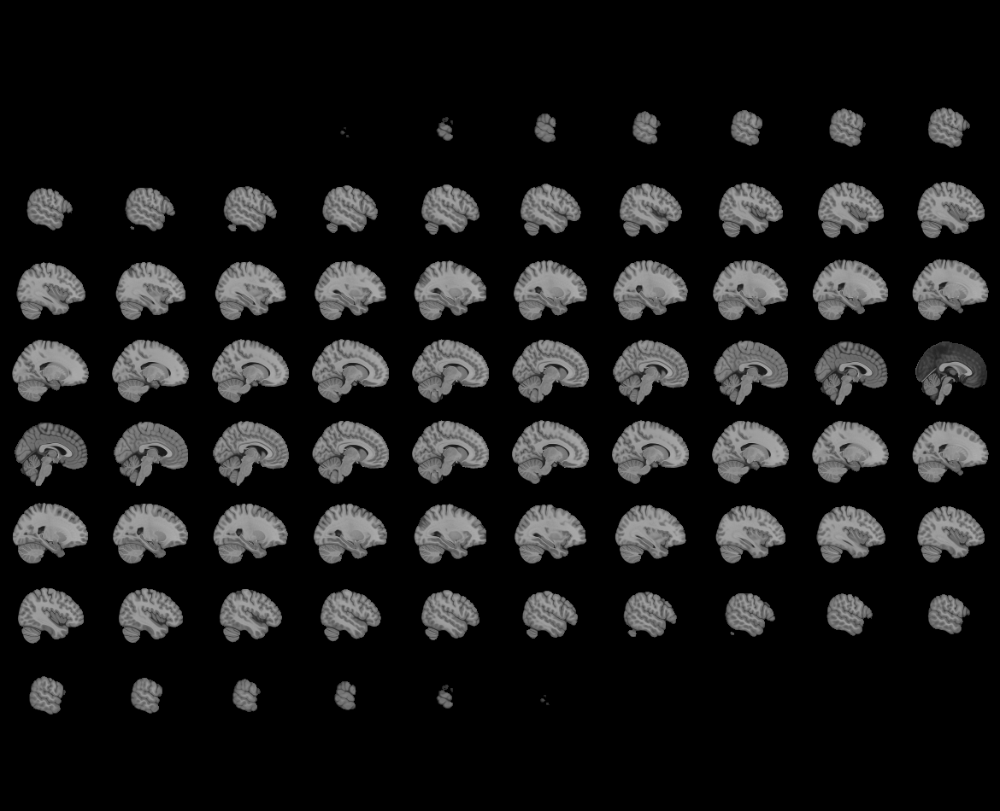
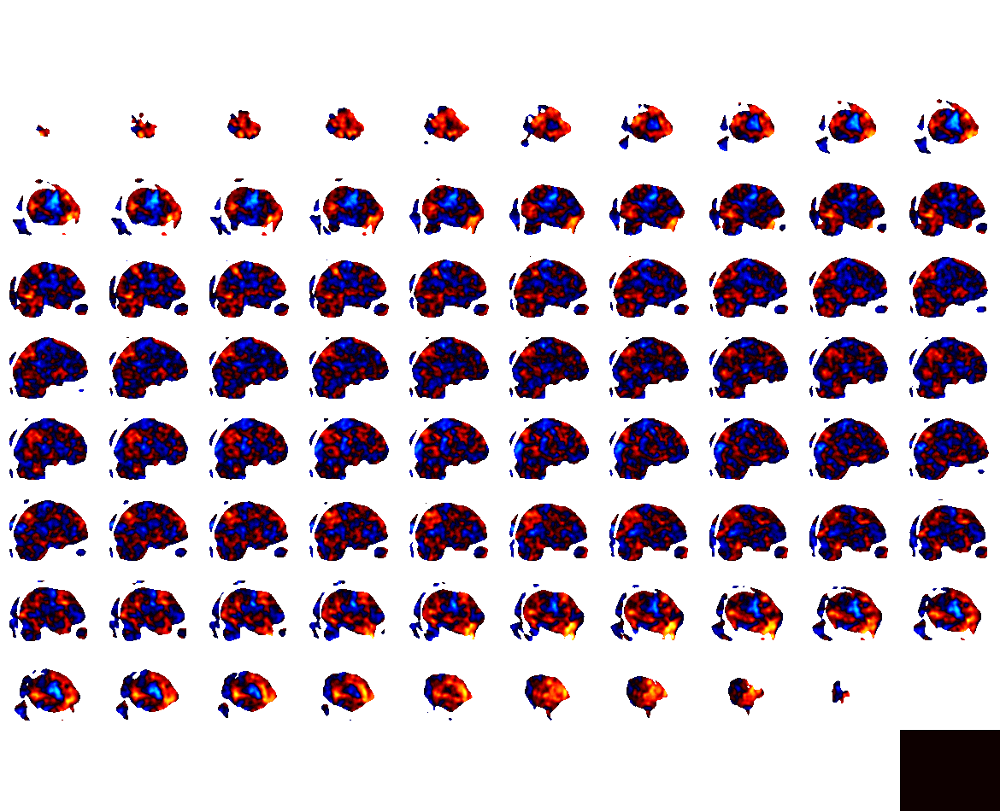

In [28]:
dataDir = '../GLM/betas/'
subs = os.listdir(dataDir)
sub = 1
beta = 1
# 1, 'Pl-AI_Pl'
# 2, 'Nt-AI_Nt'
# 3, 'Up-AI_Up'
# 4, 'Pl-Nt'
# 5, 'Pl-Up'
# 6, 'Nt-Up'
niifilename = f'spmT_000{beta}.nii'
niifile = os.path.join(dataDir, subs[sub-1], niifilename)
nii_file = nib.load(niifile)
view = plotting.view_img(nii_file)
view

# First level 

## Single subject 

In [141]:
dataDir = '../GLM/betas/'
subs = os.listdir(dataDir)
subs


['Sub1', 'Sub2', 'Sub3', 'Sub3_1d']

In [156]:
sub = subs[3]
sub

'Sub3_1d'

In [128]:
# cond = {
# 1: 'Pl-AI_Pl',
# 2: 'Nt-AI_Nt',
# 3: 'Up-AI_Up',
# 4: 'Pl-Nt',
# 5: 'Up-Pl',
# 6: 'Up-Nt',
# 7: 'AI_Pl-AI_Nt',
# 8: 'AI_Up-AI_Pl',
# 9: 'AI_Up-AI_Nt'}

# output_dir = 'F:\yujun\projects\AI_IAPS\GLM\outputs_firstlvl'

# con_nii_list = []
# spmT_nii_list = []
# p_vals = []
# corr_p_vals = []
# corrected_spmT_nii_list = []
# for i, condition in cond.items():
#     #load contrast data
#     con_filename = f'con_000{i}.nii'
#     con_file = os.path.join(dataDir, sub, con_filename)
#     con_rawdata = nib.load(con_file)

#     # Resample the MNI mask to match the dimensions and voxel size of your NIfTI file
#     mni_mask_resampled = resample_img(mask, target_affine=con_rawdata.affine, target_shape=con_rawdata.shape)
#     # Get the mask's indices in the original 3D shape
#     masked_con_data = masking.apply_mask(con_rawdata, mni_mask_resampled)
#     mask_indices = np.where(mni_mask_resampled.get_fdata())
#     # Create a new 3D array filled with zeros
#     con_3d = np.zeros(con_rawdata.shape) #spmT_3d.shape (79, 95, 79)
#     # Fill the new 3D array with the values from the masked data
#     con_3d[mask_indices] = masked_con_data
#     con_nii = new_img_like(con_rawdata, con_3d)
#     con_nii_list.append(con_nii)

#     #Load t-test data
#     spmT_filename = f'spmT_000{i}.nii'
#     spmT_file = os.path.join(dataDir, sub, spmT_filename)
#     spmT_rawdata = nib.load(spmT_file)
#     masked_spmT_data = masking.apply_mask(spmT_rawdata, mni_mask_resampled)
#     # Create a new 3D array filled with zeros
#     spmT_3d = np.zeros(spmT_rawdata.shape)
#     # Fill the new 3D array with the values from the masked data
#     spmT_3d[mask_indices] = masked_spmT_data
#     spmT_nii = new_img_like(spmT_rawdata, spmT_3d)
#     spmT_nii_list.append(spmT_nii)

#     # Calculate p-value
#     # Calculate the mean of the contrast coefficients
#     spmT_data = spmT_3d.ravel()
#     degrees_of_freedom = # 224-13
#     p_values = 2 * (1 - t.cdf(abs(spmT_data), df=degrees_of_freedom)) 
#     p_vals.append(p_values)
#     # FDR correction
#     # Perform FDR correction on the t values
#     # fdr_corrected_p, _ = fdrcorrection(p_values.ravel(), alpha=0.05)
#     rejected, corrected_p_values, _, _ = multipletests(
#     pvals=p_values,
#     alpha=0.05,  # Set your desired FDR threshold (e.g., 0.05 for 5% FDR)
#     method='fdr_bh'  # Benjamini-Hochberg FDR correction method
#     )
#     corr_p_vals.append(corrected_p_values)

#     # Reshape the FDR-corrected values back to the original 3D shape
#     threshold=0.05
#     fdr_corrected_T = np.where(corrected_p_values < threshold, spmT_data, 0)
#     fdr_corrected_T_3d = fdr_corrected_T.reshape(spmT_rawdata.shape)
#     fdr_corrected_T_nii = new_img_like(spmT_rawdata, fdr_corrected_T_3d)
#     corrected_spmT_nii_list.append(fdr_corrected_T_nii) #option2

#     # betas_3d = beta_data.reshape(nii_data.shape)
#     # betas_nii = new_img_like(nii_data, betas_3d)
#     # output_contrast_file = f'{condition}.nii'
#     # output_path = os.path.join(output_dir, f'Sub{sub}', output_contrast_file)
#     # # nib.save(betas_nii, output_path)


In [157]:
cond = {
1: 'Pl-AI_Pl',
2: 'Nt-AI_Nt',
3: 'Up-AI_Up',
4: 'Pl-Nt',
5: 'Up-Pl',
6: 'Up-Nt',
7: 'AI_Pl-AI_Nt',
8: 'AI_Up-AI_Pl',
9: 'AI_Up-AI_Nt'}

output_dir = 'F:\yujun\projects\AI_IAPS\GLM\outputs_firstlvl'

con_nii_list = []
spmT_3d_list = []
spmT_nii_list = []
p_vals = []
corr_p_vals = []
corr_T_nii_list = []
for i, condition in cond.items():
    #load contrast data
    con_filename = f'con_000{i}.nii'
    con_file = os.path.join(dataDir, sub, con_filename)
    con_rawdata = nib.load(con_file)

    # Resample the MNI mask to match the dimensions and voxel size of your NIfTI file
    mni_mask_resampled = resample_img(mask, target_affine=con_rawdata.affine, target_shape=con_rawdata.shape)
    # Get the mask's indices in the original 3D shape
    masked_con_data = masking.apply_mask(con_rawdata, mni_mask_resampled)
    mask_indices = np.where(mni_mask_resampled.get_fdata())
    # Create a new 3D array filled with zeros
    con_3d = np.zeros(con_rawdata.shape) #spmT_3d.shape (79, 95, 79)
    # Fill the new 3D array with the values from the masked data
    con_3d[mask_indices] = masked_con_data
    con_nii = new_img_like(con_rawdata, con_3d)
    con_nii_list.append(con_nii)

    #Load t-test data
    spmT_filename = f'spmT_000{i}.nii'
    spmT_file = os.path.join(dataDir, sub, spmT_filename)
    spmT_rawdata = nib.load(spmT_file)
    masked_spmT_data = masking.apply_mask(spmT_rawdata, mni_mask_resampled)
    # Create a new 3D array filled with zeros
    spmT_3d = np.zeros(spmT_rawdata.shape)
    # Fill the new 3D array with the values from the masked data
    spmT_3d[mask_indices] = masked_spmT_data
    spmT_3d_list.append(spmT_3d)
    spmT_nii = new_img_like(spmT_rawdata, spmT_3d)
    spmT_nii_list.append(spmT_nii)

    # Calculate p-value
    # Calculate the mean of the contrast coefficients
    degrees_of_freedom = 20-2 # 2 conditions involved 20 trials and 2 variables
    p_val = 2 * (1 - t.cdf(abs(spmT_3d), df=degrees_of_freedom)) # the same as stats.t.sf(abs(spmT_3d), df) * 2
    p_vals.append(p_val)

    # FDR correction
    # Perform FDR correction on the t values
    # fdr_corrected_p, _ = fdrcorrection(p_values.ravel(), alpha=0.05)
    rejected, corr_p_val, _, _ = multipletests(
    pvals=p_val.flatten(order = 'F'),
    alpha=0.05,  # Set your desired FDR threshold (e.g., 0.05 for 5% FDR)
    method='fdr_bh'  # Benjamini-Hochberg FDR correction method
    )
    corr_p_vals.append(corr_p_val)
    corr_p_val_3d = corr_p_val.reshape(p_val.shape)

    # Reshape the FDR-corrected values back to the original 3D shape
    threshold=0.05
    corr_T = np.where(corr_p_val_3d < threshold, spmT_3d, 0)
    corr_T_nii = new_img_like(spmT_rawdata, corr_T)
    corr_T_nii_list.append(corr_T_nii) #option2

    # betas_3d = beta_data.reshape(nii_data.shape)
    # betas_nii = new_img_like(nii_data, betas_3d)
    # output_contrast_file = f'{condition}.nii'
    # output_path = os.path.join(output_dir, f'Sub{sub}', output_contrast_file)
    # # nib.save(betas_nii, output_path)


In [105]:
np.count_nonzero(corr_T>0)

0

#### Contrast coefficients

In [109]:
#subject #
s=4
#condition #
i=6
# cond = {
# 1: 'Pl-AI_Pl',
# 2: 'Nt-AI_Nt',
# 3: 'Up-AI_Up',
# 4: 'Pl-Nt',
# 5: 'Up-Pl',
# 6: 'Up-Nt',
# 7: 'AI_Pl-AI_Nt',
# 8: 'AI_Up-AI_Pl',
# 9: 'AI_Up-AI_Nt'}

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



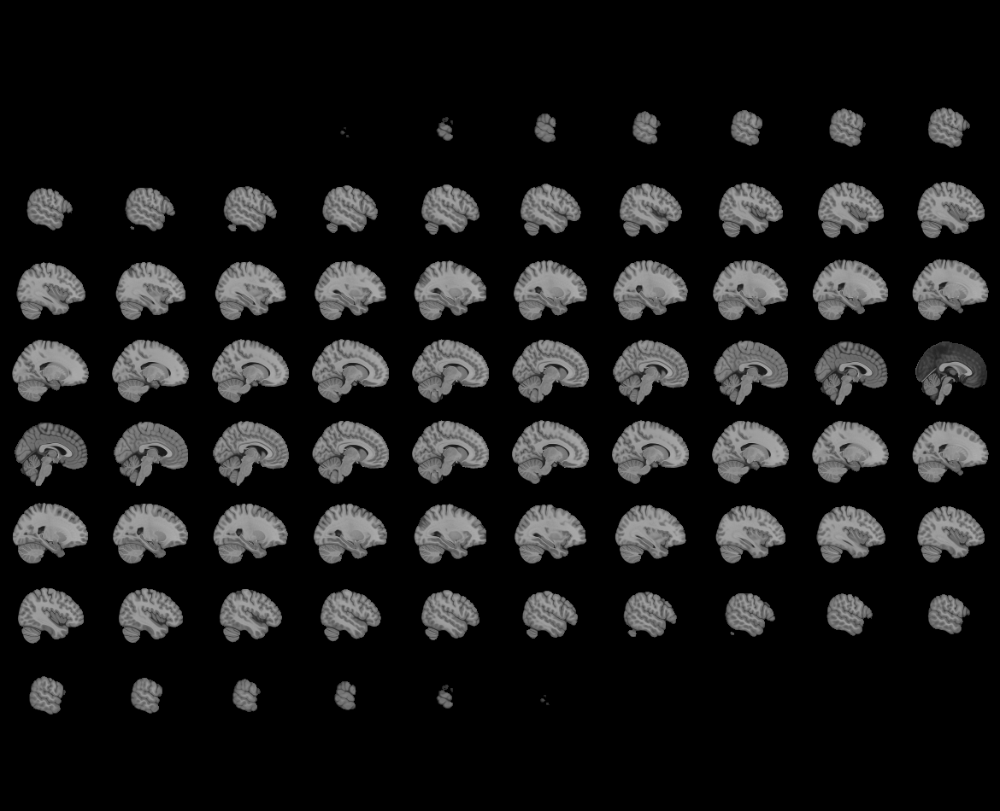
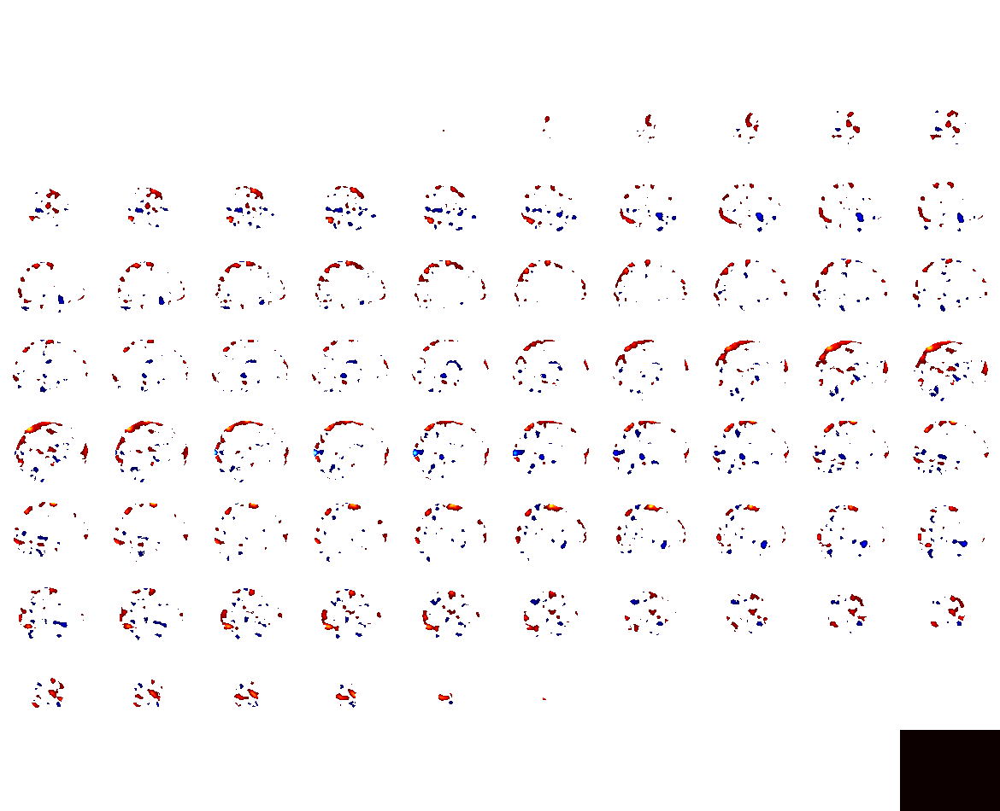

In [155]:
s=3
i=3
view = plotting.view_img(con_nii_list[i-1], threshold =2, title = f'{subs[s-1], list(cond.values())[i-1]}')
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



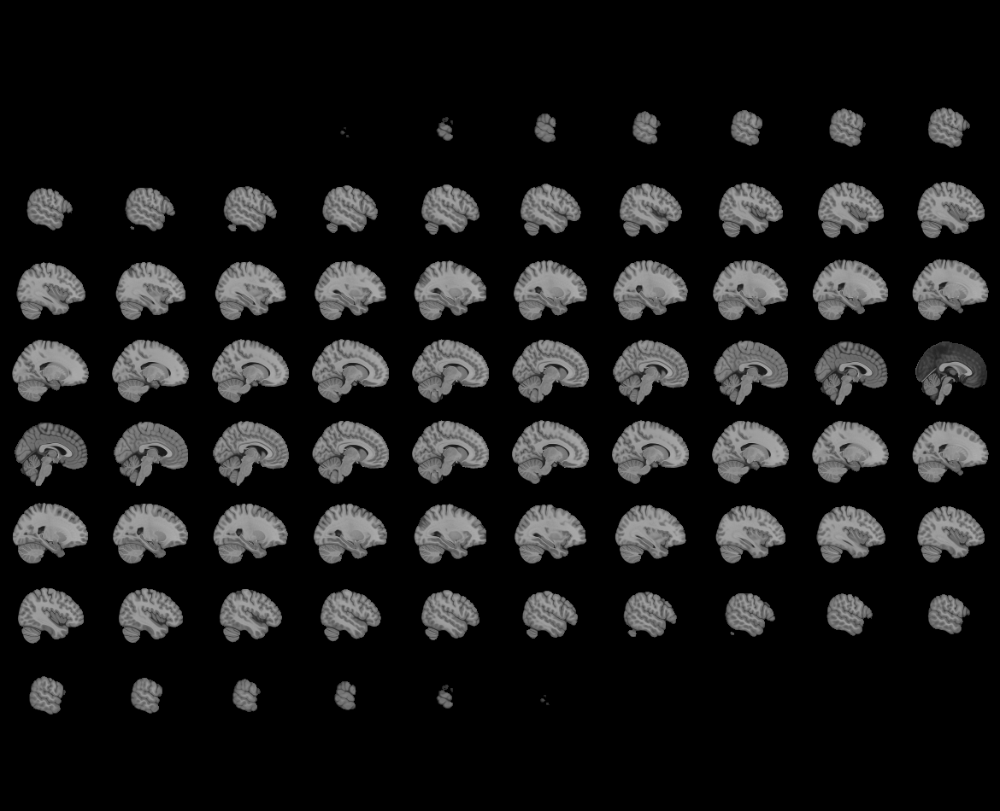
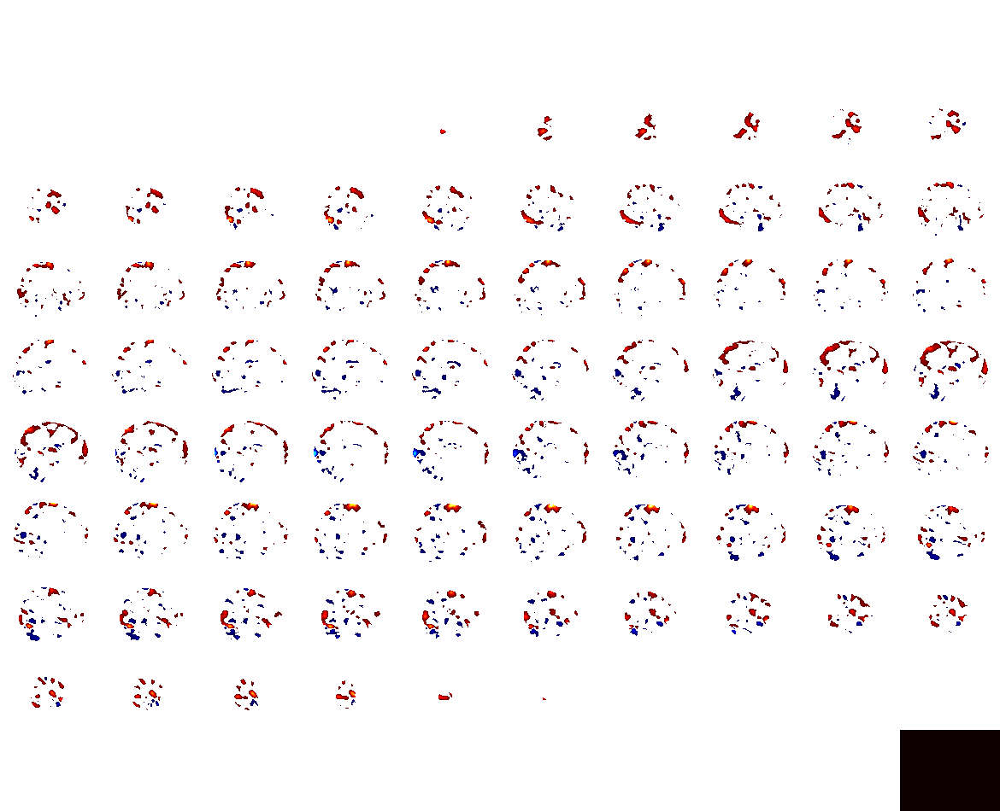

In [158]:
s=4
i=3
view = plotting.view_img(con_nii_list[i-1], threshold =2, title = f'{subs[s-1], list(cond.values())[i-1]}')
view

#### P values

In [72]:
np.array(p_vals).shape

(9, 79, 95, 79)

(array([[  7753.,  14340.,  18929.,  22209.,  24280.,  25424.,  26580.,
          27564.,  27949., 397867.],
        [ 31231.,  26778.,  24446.,  22853.,  21284.,  20241.,  19537.,
          19196.,  19059., 388270.],
        [ 22848.,  23853.,  22821.,  22533.,  22473.,  22130.,  21692.,
          21901.,  21597., 391047.],
        [ 42971.,  28682.,  23506.,  21086.,  19337.,  18416.,  17815.,
          17180.,  17269., 386633.],
        [ 38330.,  24487.,  22301.,  21077.,  19961.,  19723.,  19231.,
          19402.,  19558., 388825.],
        [ 15891.,  21926.,  22290.,  22889.,  22855.,  23345.,  23516.,
          23737.,  23415., 393031.],
        [ 39242.,  26977.,  23696.,  21452.,  20253.,  19562.,  18388.,
          18122.,  17943., 387260.],
        [ 13546.,  16945.,  19932.,  21895.,  23566.,  24323.,  25578.,
          25857.,  25979., 395274.],
        [ 28013.,  26158.,  23814.,  22730.,  21802.,  20909.,  20450.,
          20058.,  19947., 389014.]]),
 array([8.9493141

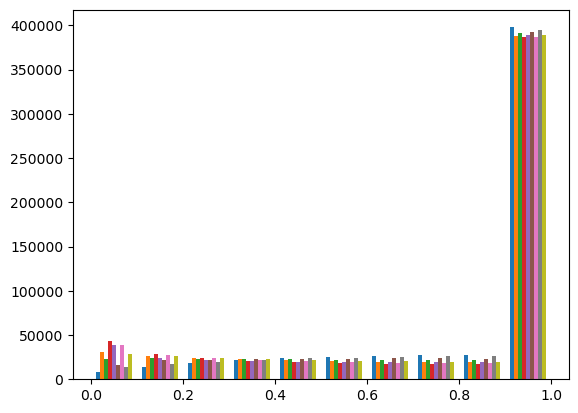

In [73]:
plt.hist(np.array(p_vals).reshape(9, -1)[:].T)

#### Corrected p-value dist

(array([[     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0., 592895.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0., 592895.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0., 592895.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,   2990., 589905.],
        [  3574.,   1046.,   1220.,   1143.,   1141.,   1277.,   1187.,
           1479.,   1187., 579641.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0., 592895.],
        [     0.,      0.,      0.,   1282.,   1085.,   1187.,   1819.,
           1935.,   1645., 583942.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0., 592895.],
        [     0.,      0.,      0.,      0.,      0.,      0.,      0.,
              0.,      0., 592895.]]),
 array([0.5436343

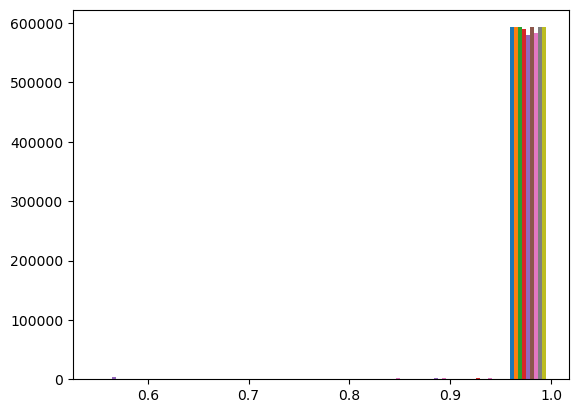

In [74]:
plt.hist(np.array(corr_p_vals).reshape(9, -1)[:].T)

#### SPM t-stat 

(array([[1.00000e+00, 2.63000e+02, 5.26900e+03, 5.55690e+04, 4.86069e+05,
         4.32350e+04, 2.47500e+03, 1.40000e+01, 0.00000e+00, 0.00000e+00],
        [6.00000e+00, 6.60000e+02, 9.16600e+03, 4.49670e+04, 4.49107e+05,
         6.43080e+04, 2.08840e+04, 3.52100e+03, 2.64000e+02, 1.20000e+01],
        [1.00000e+01, 3.56000e+02, 8.30900e+03, 5.05360e+04, 4.60583e+05,
         5.64700e+04, 1.44220e+04, 1.96600e+03, 2.43000e+02, 0.00000e+00],
        [3.11000e+02, 4.25300e+03, 2.06090e+04, 4.68010e+04, 4.41725e+05,
         5.84390e+04, 1.90450e+04, 1.60500e+03, 9.50000e+01, 1.20000e+01],
        [2.80000e+01, 6.99000e+02, 8.63100e+03, 4.40160e+04, 4.50479e+05,
         5.71080e+04, 2.32210e+04, 7.56800e+03, 1.10200e+03, 4.30000e+01],
        [4.00000e+00, 2.40000e+02, 5.03900e+03, 3.62040e+04, 4.65969e+05,
         7.17090e+04, 1.31330e+04, 5.81000e+02, 1.60000e+01, 0.00000e+00],
        [3.34000e+02, 2.78000e+03, 1.17940e+04, 3.27160e+04, 4.43266e+05,
         7.34240e+04, 2.41470e+0

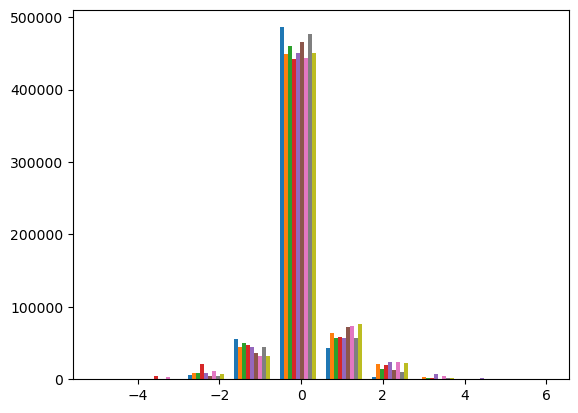

In [80]:
plt.hist(np.array(spmT_3d_list).reshape(9, -1)[:].T)

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



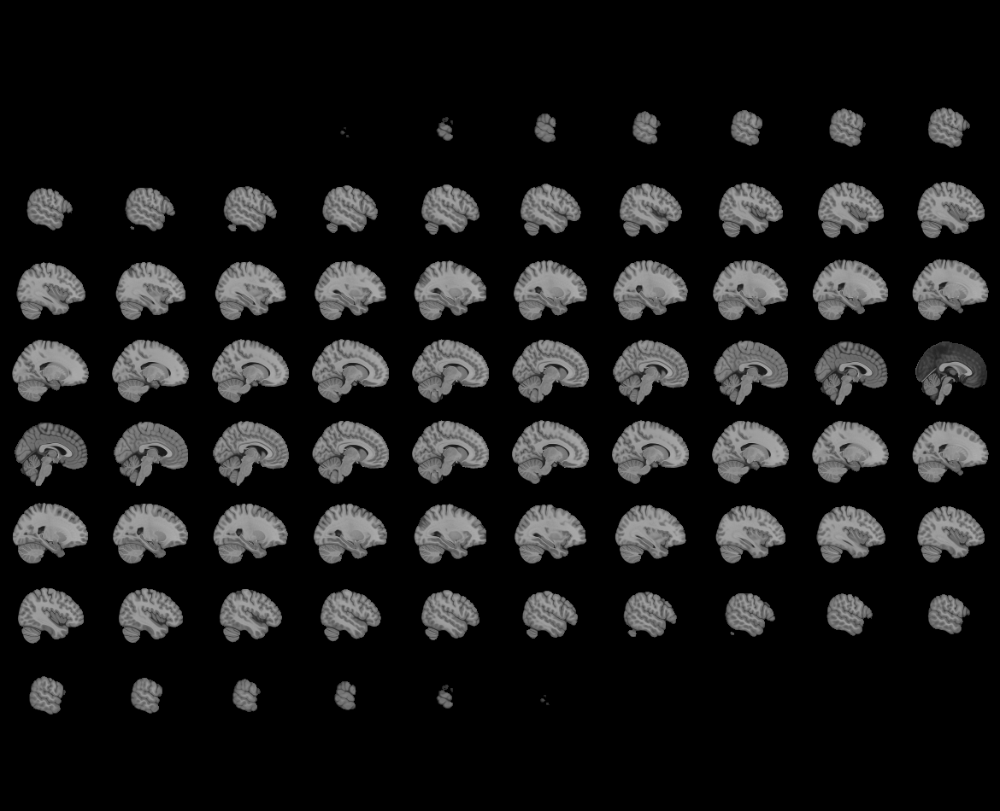
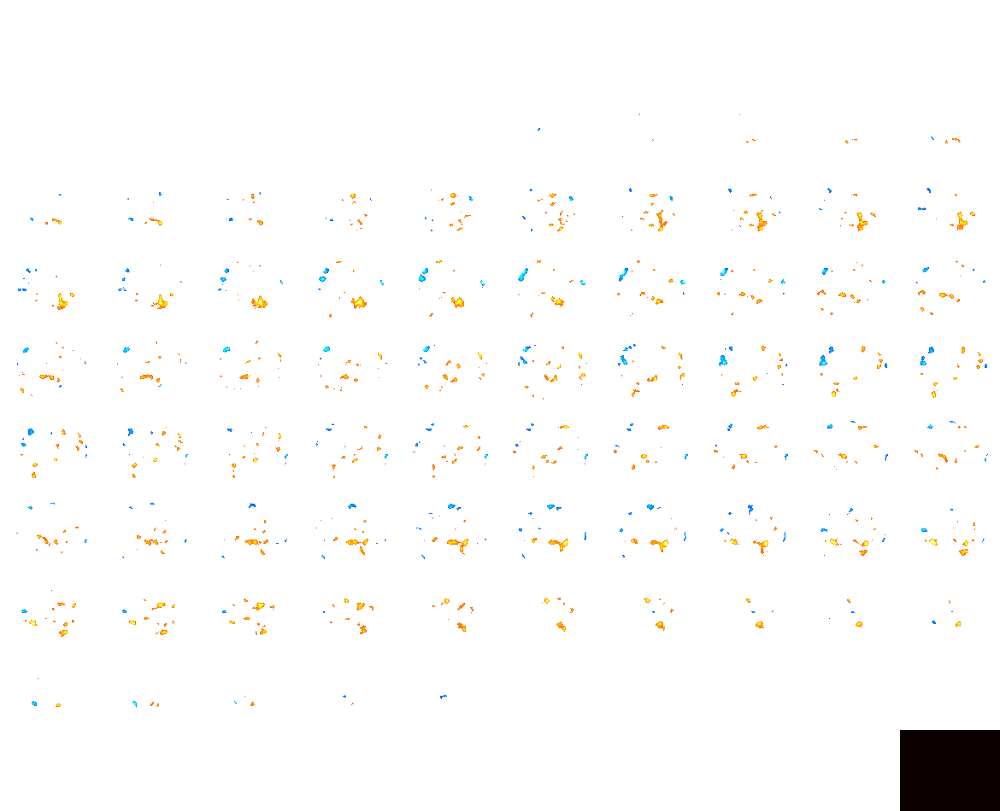

In [81]:
view = plotting.view_img(spmT_nii_list[i-1], threshold = 2.2, title = f'{subs[s-1], list(cond.values())[i-1]}')
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



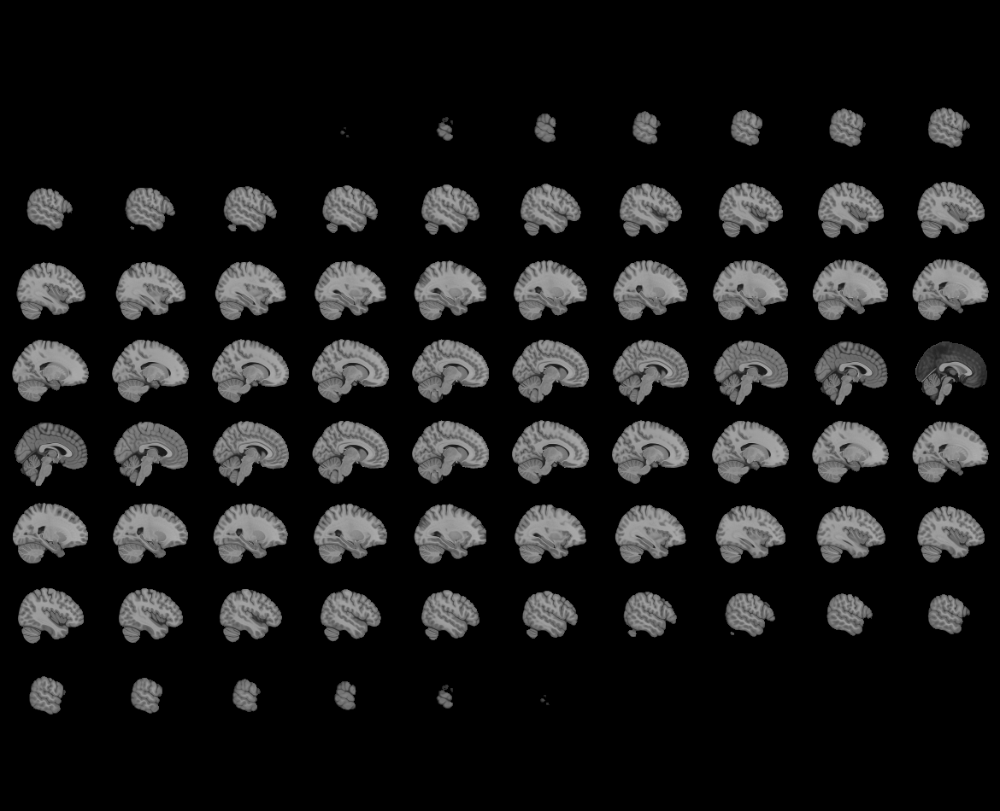
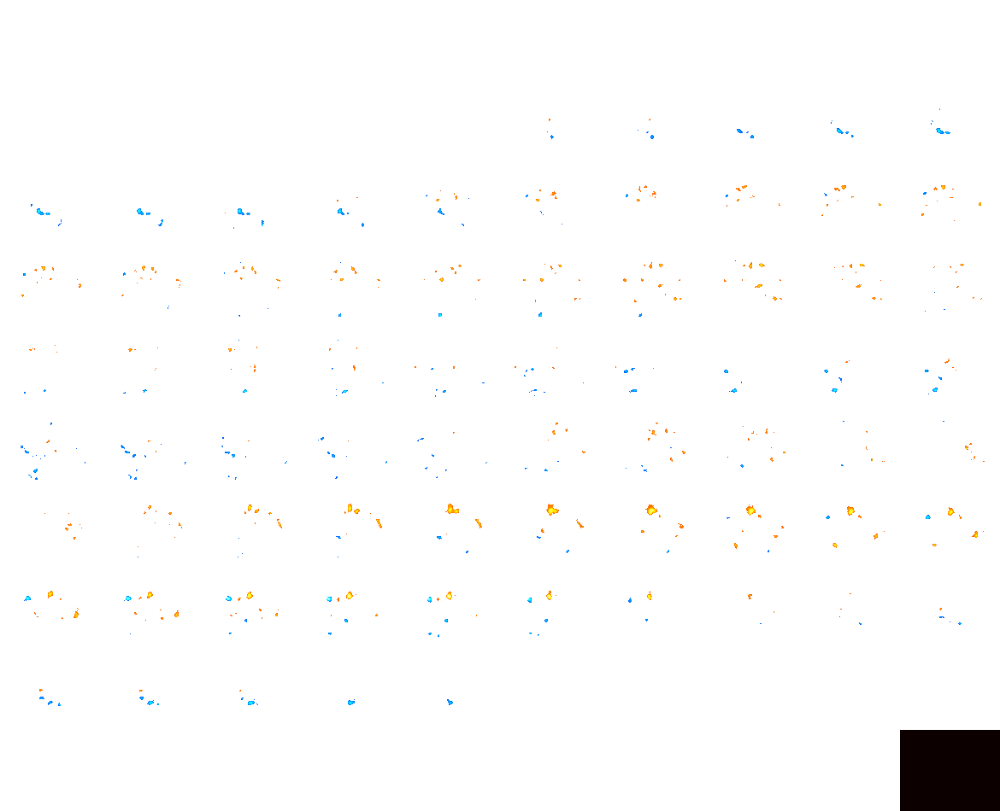

In [84]:
view = plotting.view_img(spmT_nii_list[i-1], threshold = 2.2, title = f'{subs[s-1], list(cond.values())[i-1]}')
view

#### FDR corrected SPM t-test

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\param_validation.py:72: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06 
  warnings.warn("The given float value must not exceed {0}. "
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\find_cuts.py:69: UserWarning: Given img is empty. Returning default cut_coords=(0.0, 0.0, 0.0) instead.
  warnings.warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



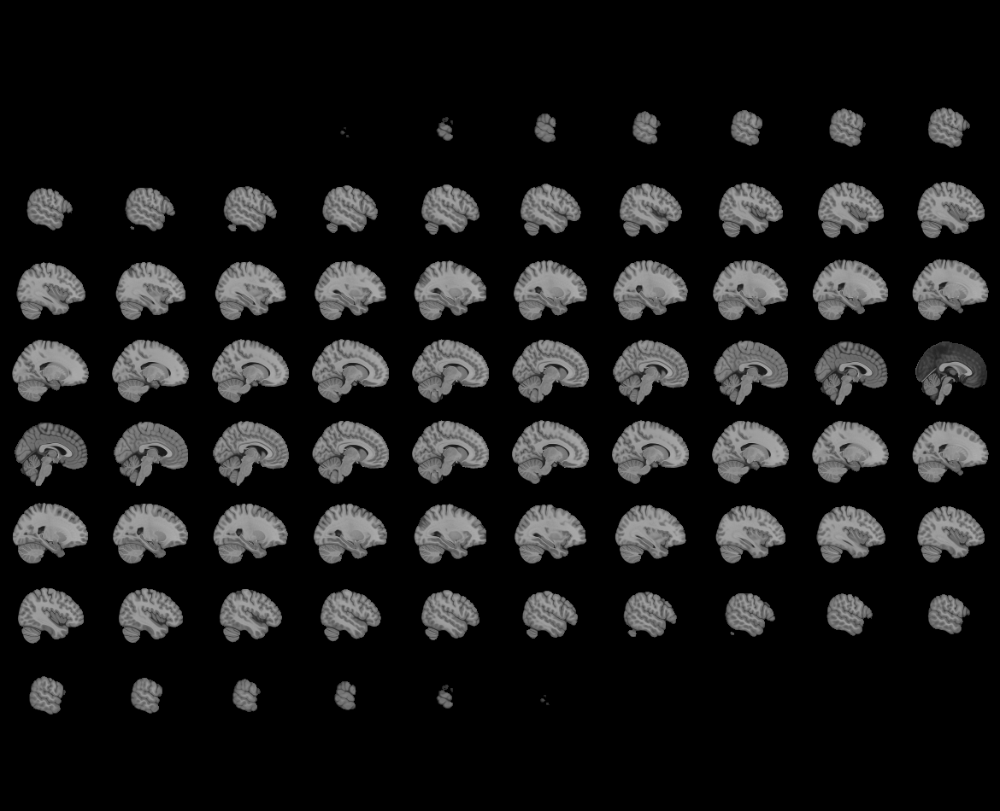
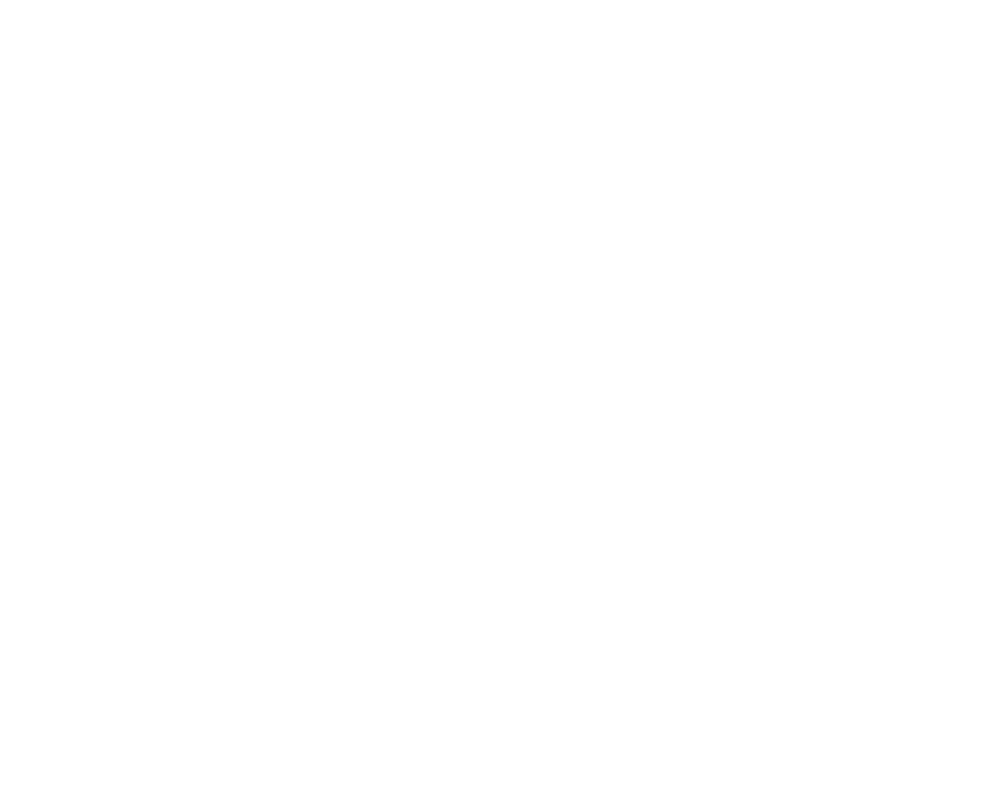

In [127]:
i=5

view = plotting.view_img(corr_T_nii_list[i-1], title = f'{subs[s-1], list(cond.values())[i-1]}')
view

## Multiple subjects 

In [5]:
dataDir = '../GLM/betas/'
# subs = os.listdir(dataDir)
subs = ['Sub1', 'Sub2', 'Sub3_1d']
cond = {
1: 'Pl-AI_Pl',
2: 'Nt-AI_Nt',
3: 'Up-AI_Up',
4: 'Pl-Nt',
5: 'Up-Pl',
6: 'Up-Nt',
7: 'AI_Pl-AI_Nt',
8: 'AI_Up-AI_Pl',
9: 'AI_Up-AI_Nt'
}

In [8]:
# output_dir = 'F:\yujun\projects\AI_IAPS\GLM\outputs_firstlvl'

allsubs_con_nii_list = []
allsubs_spmT_nii_list = []
allsubs_p_vals = []
allsubs_thresh_T_nii_list = []
allsubs_corr_p_vals = []
allsubs_corrected_spmT_nii_list = []

for s, sub in enumerate(subs):
    con_nii_list = []
    spmT_nii_list = []
    p_vals = []
    threshold_T_nii_list = []
    corr_p_vals = []
    corrected_spmT_nii_list = []
    for i, condition in cond.items():
        #load contrast data
        con_filename = f'con_000{i}.nii'
        con_file = os.path.join(dataDir, sub, con_filename)
        con_rawdata = nib.load(con_file)

        # Resample the MNI mask to match the dimensions and voxel size of your NIfTI file
        mni_mask_resampled = resample_img(mask, target_affine=con_rawdata.affine, target_shape=con_rawdata.shape)
        # Get the mask's indices in the original 3D shape
        masked_con_data = masking.apply_mask(con_rawdata, mni_mask_resampled)
        mask_indices = np.where(mni_mask_resampled.get_fdata())
        # Create a new 3D array filled with zeros
        con_3d = np.zeros(con_rawdata.shape)
        # Fill the new 3D array with the values from the masked data
        con_3d[mask_indices] = masked_con_data
        con_nii = new_img_like(con_rawdata, con_3d)
        con_nii_list.append(con_nii)

        #Load t-test data
        spmT_filename = f'spmT_000{i}.nii'
        spmT_file = os.path.join(dataDir, sub, spmT_filename)
        spmT_rawdata = nib.load(spmT_file)
        masked_spmT_data = masking.apply_mask(spmT_rawdata, mni_mask_resampled)
        # Create a new 3D array filled with zeros
        spmT_3d = np.zeros(spmT_rawdata.shape)
        # Fill the new 3D array with the values from the masked data
        spmT_3d[mask_indices] = masked_spmT_data
        spmT_nii = new_img_like(spmT_rawdata, spmT_3d)
        spmT_nii_list.append(spmT_nii)

        # Calculate p-value
        # Calculate the mean of the contrast coefficients
        spmT_data = spmT_3d.flatten()
        degrees_of_freedom = 224-13
        p_values = 2 * (1 - t.cdf(abs(spmT_data), df=degrees_of_freedom))
        threshold_T = np.where(p_values <= 0.05, spmT_data, 0)
        threshold_T_3d = threshold_T.reshape(spmT_rawdata.shape)
        threshold_T_nii = new_img_like(spmT_rawdata, threshold_T_3d)
        threshold_T_nii_list.append(threshold_T_nii) #option2
        p_vals.append(p_values)
        # FDR correction
        # Perform FDR correction on the t values
        # fdr_corrected_p, _ = fdrcorrection(p_values.ravel(), alpha=0.05)
        rejected, corrected_p_values, _, _ = multipletests(
        pvals=p_values,
        alpha=0.05,  # Set your desired FDR threshold (e.g., 0.05 for 5% FDR)
        method='fdr_bh'  # Benjamini-Hochberg FDR correction method
        )
        corr_p_vals.append(corrected_p_values)

        # Reshape the FDR-corrected values back to the original 3D shape
        threshold=0.05
        fdr_corrected_T = np.where(corrected_p_values < threshold, spmT_data, 0)
        fdr_corrected_T_3d = fdr_corrected_T.reshape(spmT_rawdata.shape)
        fdr_corrected_T_nii = new_img_like(spmT_rawdata, fdr_corrected_T_3d)
        corrected_spmT_nii_list.append(fdr_corrected_T_nii) #option2

    allsubs_con_nii_list.append(np.array(con_nii_list))   
    allsubs_spmT_nii_list.append(np.array(spmT_nii_list))
    allsubs_p_vals.append(np.array(p_vals) )
    allsubs_thresh_T_nii_list.append(np.array(threshold_T_nii_list))
    allsubs_corr_p_vals.append(np.array(corr_p_vals)) 
    allsubs_corrected_spmT_nii_list.append(np.array(corrected_spmT_nii_list)) 


p-value distribution

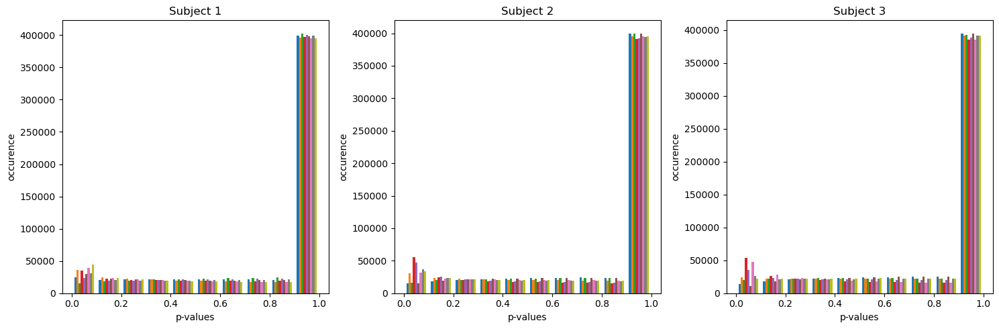

In [10]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Iterate through subjects
for sub in range(3):
    # Create a histogram for the subject's data in a separate subplot
    axs[sub].hist(np.array(allsubs_p_vals[sub]).reshape(9, -1)[:].T)
    axs[sub].set_title(f'Subject {sub + 1}')
    axs[sub].set_xlabel('p-values')
    axs[sub].set_ylabel('occurence')

# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the figures
plt.show()

Corrected p-value distribution

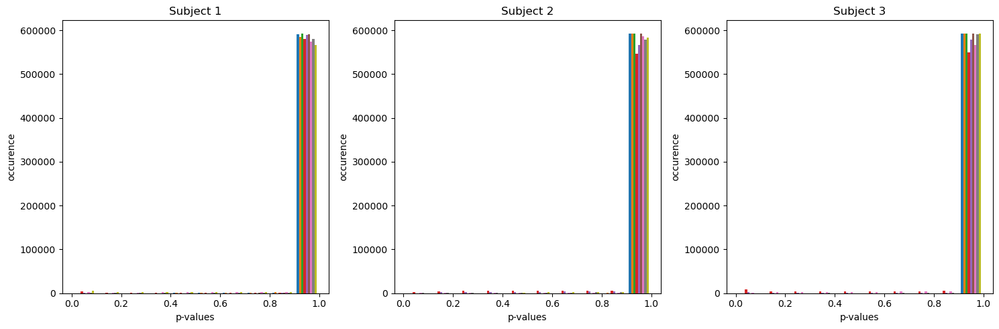

In [11]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Iterate through subjects
for sub in range(3):
    # Create a histogram for the subject's data in a separate subplot
    axs[sub].hist(np.array(allsubs_corr_p_vals[sub]).reshape(9, -1)[:].T)
    axs[sub].set_title(f'Subject {sub + 1}')
    axs[sub].set_xlabel('p-values')
    axs[sub].set_ylabel('occurence')

# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the figures
plt.show()

t-stat distribution

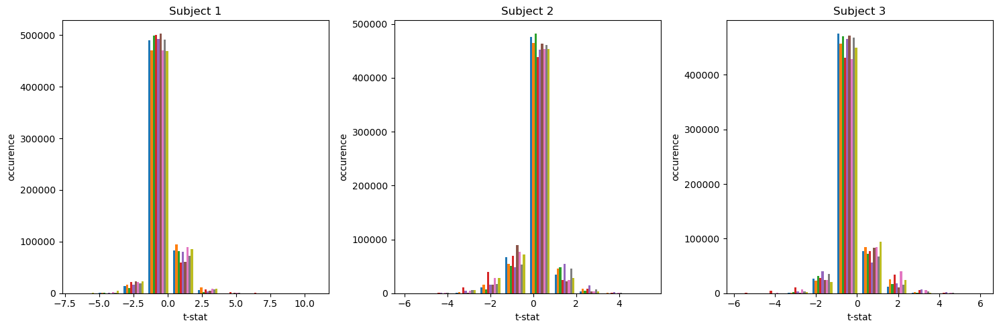

In [44]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Flatten the axs array for easier iteration
axs = axs.flatten()

# Iterate through subjects
for sub in range(3):
    sub_data_list = []
    for cond in range(9):
        # Create a histogram for the subject's data in a separate subplot
        sub_data = allsubs_spmT_nii_list[sub][cond].get_fdata()
        sub_data_list.append(sub_data) 
    sub_data_arr = np.array(sub_data_list)
    axs[sub].hist(sub_data_arr.reshape(9, -1)[:].T)
    axs[sub].set_title(f'Subject {sub + 1}')
    axs[sub].set_xlabel('t-stat')
    axs[sub].set_ylabel('occurence')

# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the figures
plt.show()

P-value thresholded t-stat distribution

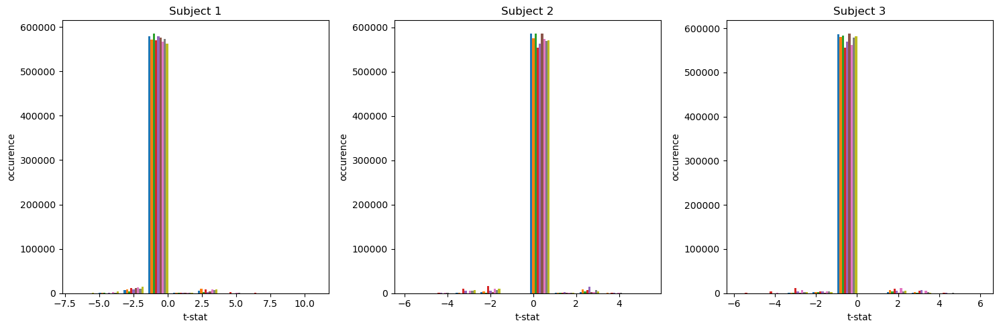

In [46]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Flatten the axs array for easier iteration
axs = axs.flatten()

# Iterate through subjects
for sub in range(3):
    sub_data_list = []
    for cond in range(9):
        # Create a histogram for the subject's data in a separate subplot
        sub_data = allsubs_thresh_T_nii_list[sub][cond].get_fdata()
        sub_data_list.append(sub_data) 
    sub_data_arr = np.array(sub_data_list)
    axs[sub].hist(sub_data_arr.reshape(9, -1)[:].T)
    axs[sub].set_title(f'Subject {sub + 1}')
    axs[sub].set_xlabel('t-stat')
    axs[sub].set_ylabel('occurence')

# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the figures
plt.show()

T-stat

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



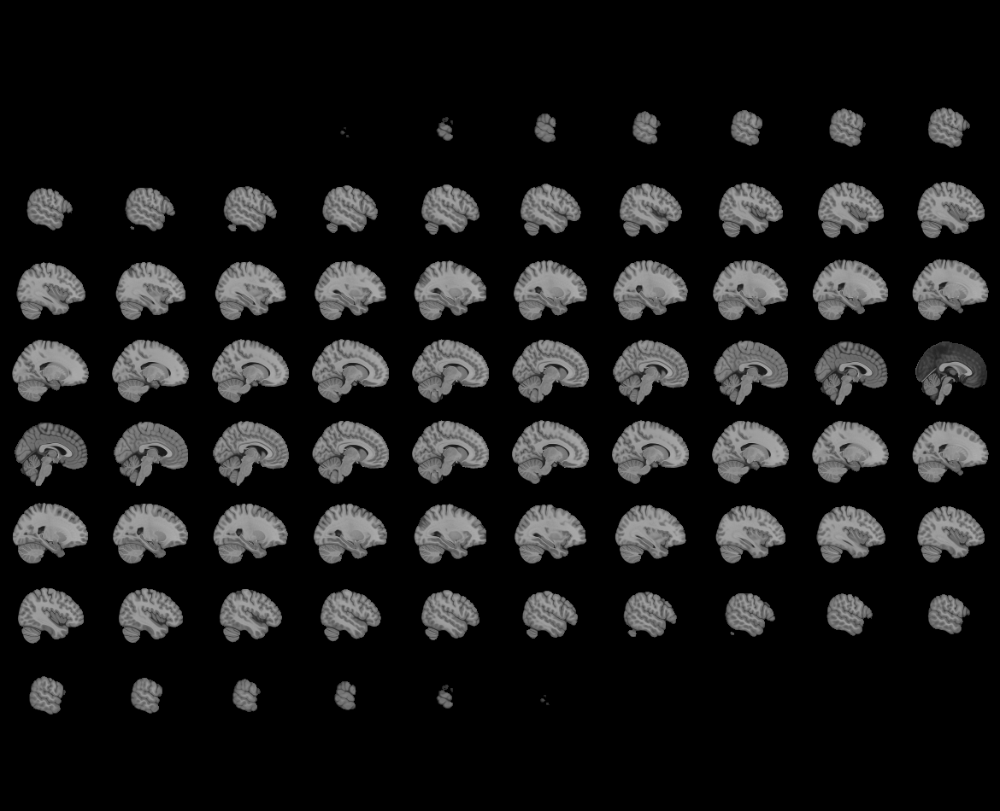
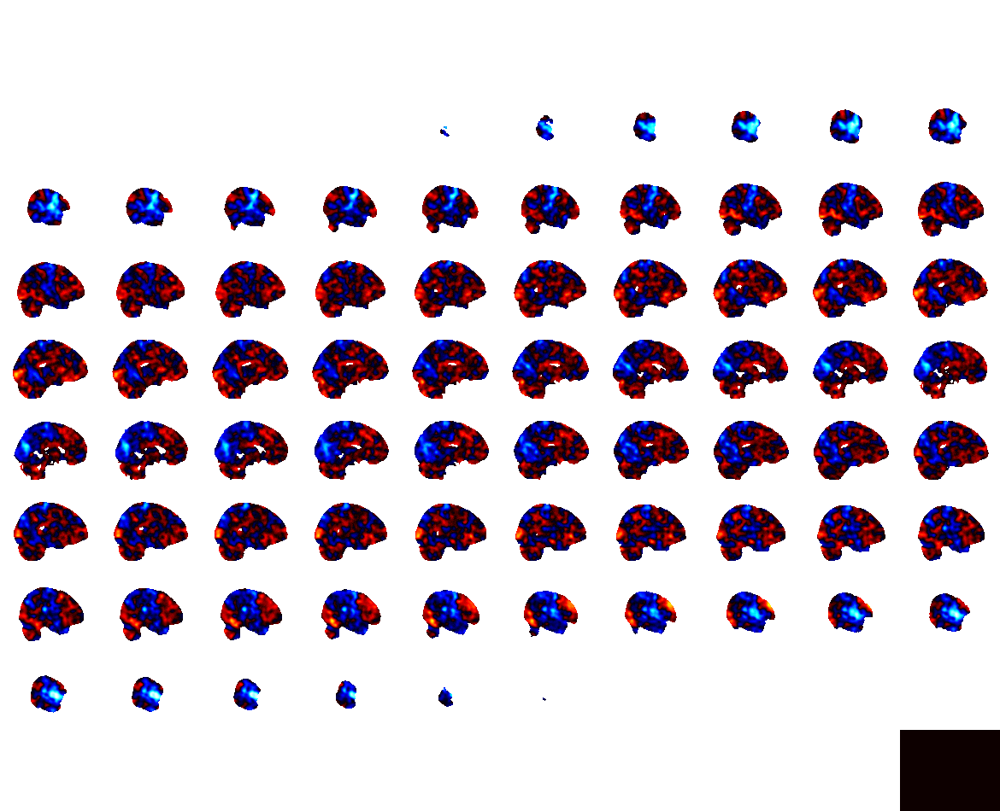

In [55]:
s=1 # 1-3
i=9 # 1-9
view = plotting.view_img(allsubs_spmT_nii_list[s-1][i-1], title = f'{s, list(cond.values())[i-1]}')
view

Thresholded spmT 

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



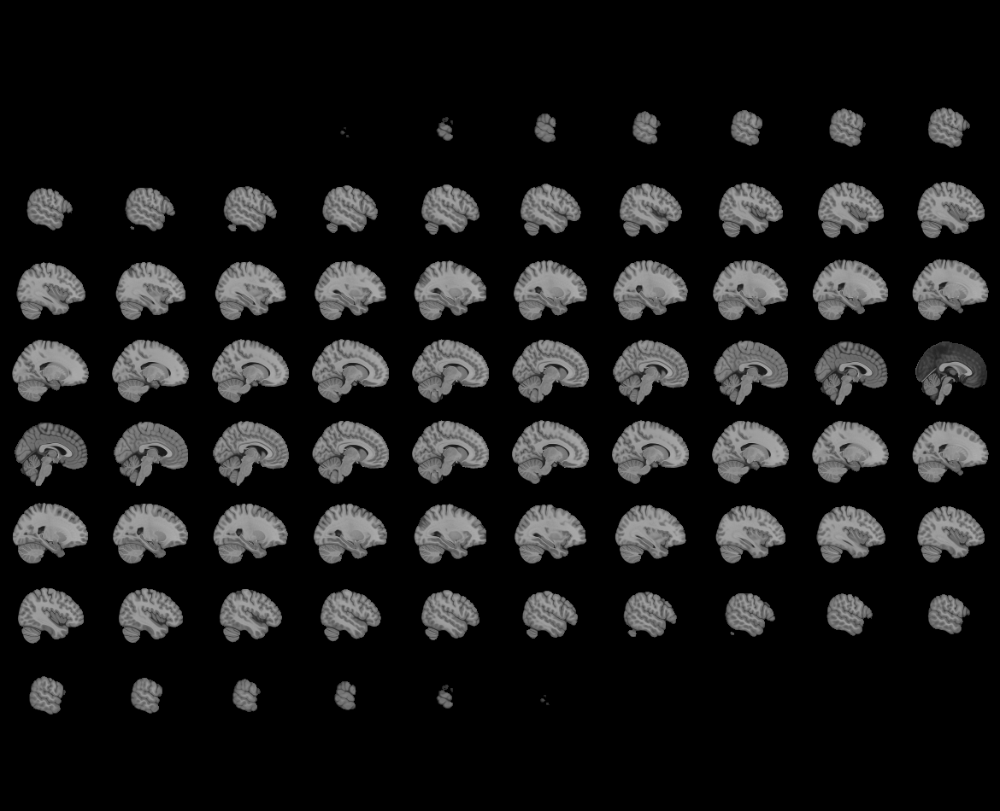
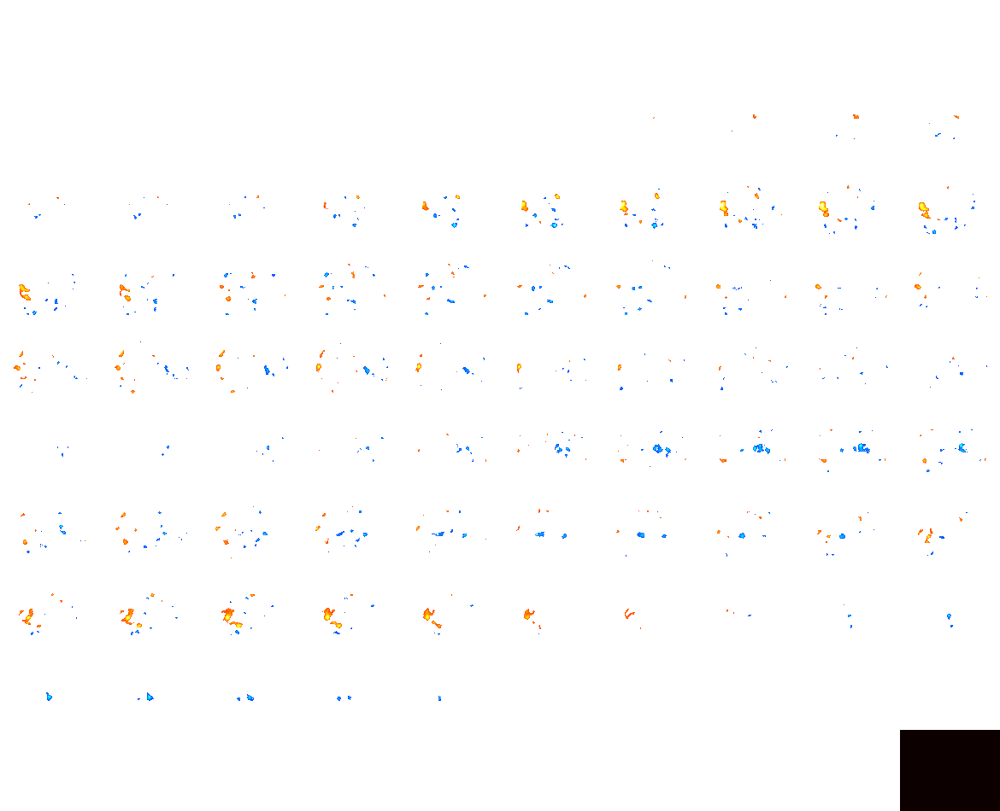

In [111]:
s=2 # 1-3
i=6 # 1-9
view = plotting.view_img(allsubs_thresh_T_nii_list[s-1][i-1], title = f'subject {s}, {list(cond.values())[i-1]}')
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



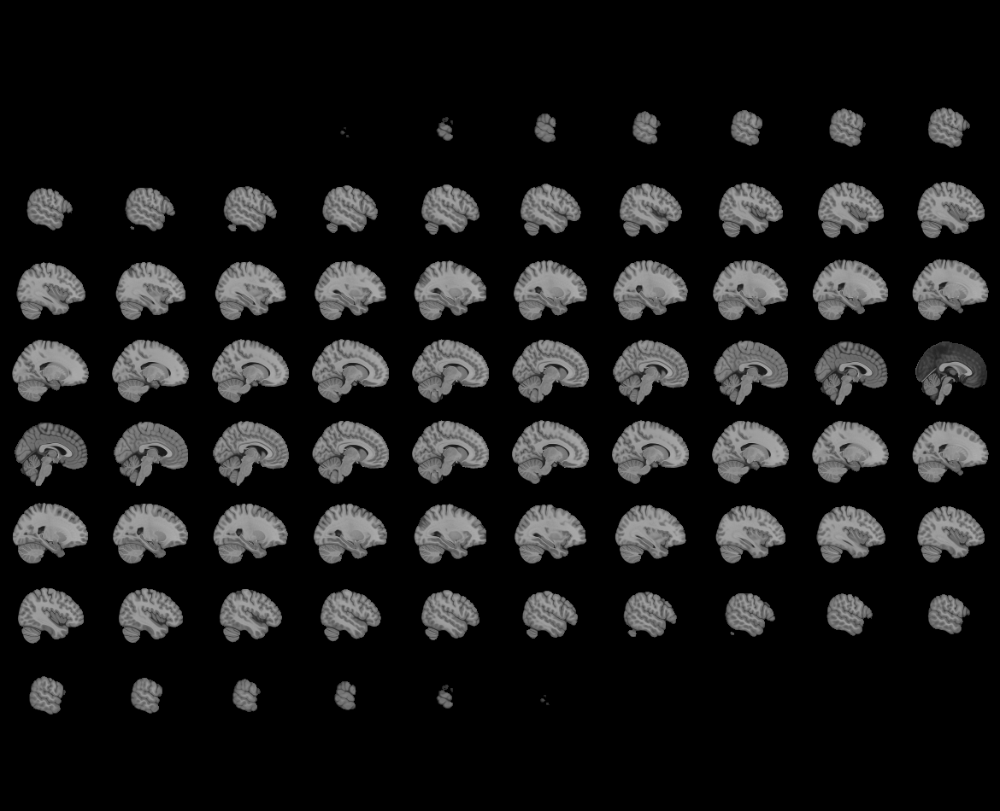
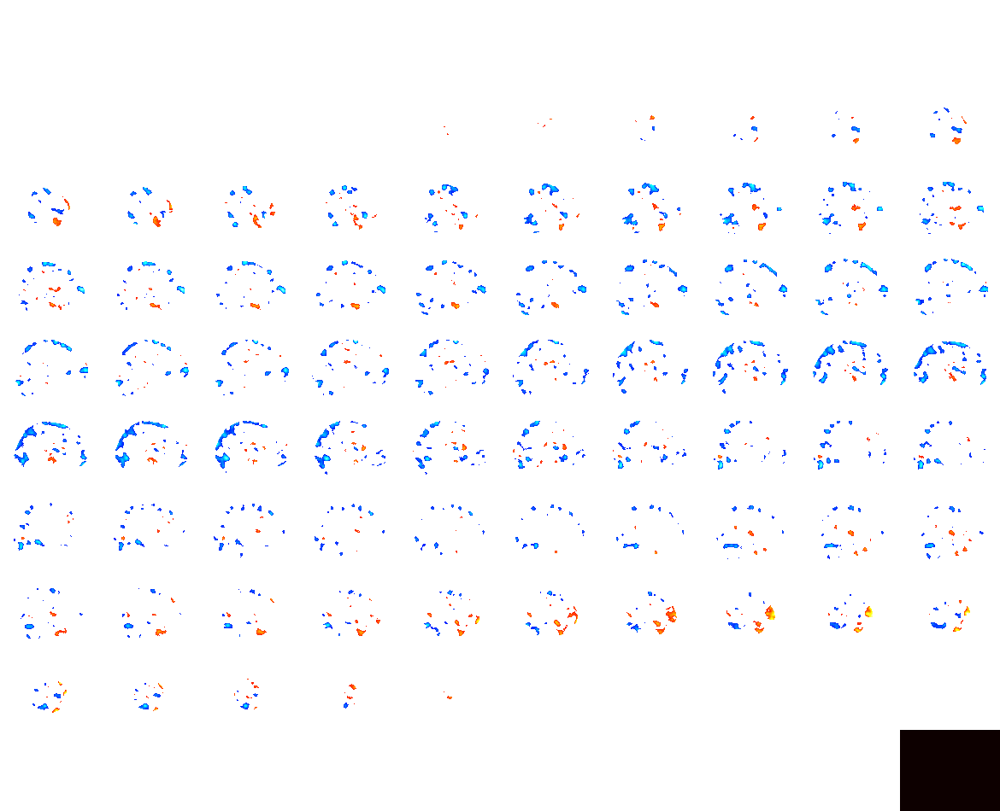

In [110]:
s = 2 # 1-3
i=9 # 1-9
view = plotting.view_img(allsubs_thresh_T_nii_list[s-1][i-1], title = f'subject {s}, {list(cond.values())[i-1]}')
view

# Second level

### One-sample T-Test per condition

In [94]:
dataDir = '../GLM/betas/'
nii_tmp = nib.load('F:\yujun\projects\AI_IAPS\GLM\\betas\Sub1\\con_0001.nii')
subs = ['Sub1', 'Sub2', 'Sub3_d1']
cond = {
1: 'Pl-AI_Pl',
2: 'Nt-AI_Nt',
3: 'Up-AI_Up',
4: 'Pl-Nt',
5: 'Up-Pl',
6: 'Up-Nt',
7: 'AI_Pl-AI_Nt',
8: 'AI_Up-AI_Pl',
9: 'AI_Up-AI_Nt'}
output_dir = r'F:\yujun\projects\AI_IAPS\GLM\outputs_firstlvl\allsub'

condition_contrast_subs = []
condition_contrast_t = []
condition_contrast_p = []
condition_contrast_corr_p = []
condition_contrast_thresh_t = []
condition_contrast_thresh_t_nii = []
z_scor_list = []

# Resample the MNI mask to match the dimensions and voxel size of your NIfTI file
mni_mask_resampled = resample_img(mask, target_affine=nii_tmp.affine, target_shape=nii_tmp.shape)

for i, condition in cond.items():
    contrast_subs_list = []
    for sub in subs:
        contrast_niifile = os.path.join(dataDir, sub , f'con_000{i}.nii')
        nii_data = nib.load(contrast_niifile)

        masked_data = masking.apply_mask(nii_data, mni_mask_resampled)
        # Get the mask's indices in the original 3D shape
        mask_indices = np.where(mni_mask_resampled.get_fdata())
        # Create a new 3D array filled with zeros
        reshaped_data = np.zeros(nii_data.shape)
        # Fill the new 3D array with the values from the masked data
        reshaped_data[mask_indices] = masked_data
        contrast_subs_list.append(reshaped_data)

    contrast_subs_arr = np.array(contrast_subs_list) # replaced by z_contrast_sub_list
    contrast_subs_arr_flat = contrast_subs_arr.reshape(len(subs), -1)   
    condition_contrast_subs.append(contrast_subs_arr_flat) 

    t_stat_list = []
    p_value_list = []
    for i in range(contrast_subs_arr_flat.shape[-1]): # number of voxels
        # t_statistic, p_value = stats.ttest_1samp(a=contrast_subs_arr_flat[:,i], popmean=0) 
        t_statistic, p_value = stats.ttest_1samp(a=contrast_subs_arr_flat[:,i], popmean=0) 
        t_stat_list.append(t_statistic)
        p_value_list.append(p_value)
    t_stat_array = np.array(t_stat_list)
    p_value_array = np.array(p_value_list)

    #FDR
    index_nonan = ~np.isnan(p_value_array)
    data_with_placeholder = np.where(np.isnan(p_value_array), -1, p_value_array)
    # Perform FDR correction on values marked by the index
    rejected, corr_p_values, _, _ = multipletests(
        pvals=data_with_placeholder[index_nonan],
        alpha=0.05,
        method='fdr_bh'
    )
    # Create an array to store the corrected p-values
    corr_p_values_array = np.full_like(p_value_array, np.nan)
    # Assign the corrected p-values to the original positions
    corr_p_values_array[index_nonan] = corr_p_values

    condition_contrast_t.append(t_stat_array)
    condition_contrast_p.append(p_value_array)
    condition_contrast_corr_p.append(corr_p_values_array)

    # Z transformation
    index_nonan_z = ~np.isnan(t_stat_array)
    data_with_placeholder_z = np.where(np.isnan(t_stat_array), -1, t_stat_array)
    z_scores = stats.zscore(data_with_placeholder_z[index_nonan_z])
    nonan_z_array = np.full_like(t_stat_array, np.nan)
    nonan_z_array[index_nonan_z] = z_scores
    z_scor_list.append(nonan_z_array)

    print(f"Condition {condition}: Number of volxels with p-values less than 0.05 {np.count_nonzero(p_value_array<0.05)}. After correction, number is {np.count_nonzero(corr_p_values_array<0.05)}")


Condition Pl-AI_Pl: Number of volxels with p-values less than 0.05 7386. After correction, number is 0
Condition Nt-AI_Nt: Number of volxels with p-values less than 0.05 8705. After correction, number is 0
Condition Up-AI_Up: Number of volxels with p-values less than 0.05 10681. After correction, number is 0
Condition Pl-Nt: Number of volxels with p-values less than 0.05 7323. After correction, number is 0
Condition Up-Pl: Number of volxels with p-values less than 0.05 6590. After correction, number is 0
Condition Up-Nt: Number of volxels with p-values less than 0.05 9270. After correction, number is 0
Condition AI_Pl-AI_Nt: Number of volxels with p-values less than 0.05 8666. After correction, number is 0
Condition AI_Up-AI_Pl: Number of volxels with p-values less than 0.05 6865. After correction, number is 0
Condition AI_Up-AI_Nt: Number of volxels with p-values less than 0.05 10591. After correction, number is 0


In [78]:
dataDir = '../GLM/betas/'
nii_tmp = nib.load('F:\yujun\projects\AI_IAPS\GLM\\betas\Sub1\\con_0001.nii')
subs = ['Sub1', 'Sub2', 'Sub3']
cond = {
1: 'Pl-AI_Pl',
2: 'Nt-AI_Nt',
3: 'Up-AI_Up',
4: 'Pl-Nt',
5: 'Up-Pl',
6: 'Up-Nt',
7: 'AI_Pl-AI_Nt',
8: 'AI_Up-AI_Pl',
9: 'AI_Up-AI_Nt'}

# output_dir = r'F:\yujun\projects\AI_IAPS\GLM\outputs_firstlvl\allsub'
threshold = 0.05
fdr_threshold_value = 0.05

activation_maps = []
pval_activation_maps = []

# Resample the MNI mask to match the dimensions and voxel size of your NIfTI file
mni_mask_resampled = resample_img(mask, target_affine=nii_tmp.affine, target_shape=nii_tmp.shape)

for i, condition in cond.items():
    contrast_subs_list = []
    for sub in subs:
        contrast_niifile = os.path.join(dataDir, sub , f'con_000{i}.nii')
        nii_data = nib.load(contrast_niifile)

        masked_data = masking.apply_mask(nii_data, mni_mask_resampled)
        # Get the mask's indices in the original 3D shape
        mask_indices = np.where(mni_mask_resampled.get_fdata())
        # Create a new 3D array filled with zeros
        reshaped_data = np.zeros(nii_data.shape)
        # Fill the new 3D array with the values from the masked data
        reshaped_data[mask_indices] = masked_data
        contrast_subs_list.append(reshaped_data)
 
    condition_contrast_data = np.array(contrast_subs_list) # Shape: (num_subjects, 79, 95, 79)
    
    # Compute the T-statistic and p-value for each voxel
    t_stats, p_values = np.apply_along_axis(
        lambda x: stats.ttest_1samp(x, 0, axis=0)[:2],
        axis=0,
        arr=condition_contrast_data
    )
    
    # Apply multiple comparisons correction (e.g., FDR)
    _, corrected_p_values = multipletests(p_values.ravel(), method='fdr_bh', alpha=fdr_threshold_value)[:2]
    corrected_p_values = corrected_p_values.reshape(p_values.shape)
    
    # # Identify significant voxels
    # significant_mask = corrected_p_values < threshold 
    significant_mask = p_values < threshold 
    
    # Create activation map (based on T-stats)
    activation_map = np.zeros_like(p_values)
    activation_map[significant_mask] = t_stats[significant_mask]
    activation_maps.append(activation_map)

    # Create activation map (based on p-values)
    pval_activation_map = np.zeros_like(p_values)
    pval_activation_map[significant_mask] = p_values[significant_mask]
    pval_activation_maps.append(pval_activation_map)

    print(f"Condition {condition}: Number of volxels with p-values less than 0.05 {np.count_nonzero(p_values<0.05)}. After correction, number is {np.count_nonzero(corrected_p_values<0.05)}")


Condition Pl-AI_Pl: Number of volxels with p-values less than 0.05 7386. After correction, number is 0
Condition Nt-AI_Nt: Number of volxels with p-values less than 0.05 8705. After correction, number is 0
Condition Up-AI_Up: Number of volxels with p-values less than 0.05 10681. After correction, number is 0
Condition Pl-Nt: Number of volxels with p-values less than 0.05 7323. After correction, number is 0
Condition Up-Pl: Number of volxels with p-values less than 0.05 6590. After correction, number is 0
Condition Up-Nt: Number of volxels with p-values less than 0.05 9270. After correction, number is 0
Condition AI_Pl-AI_Nt: Number of volxels with p-values less than 0.05 8666. After correction, number is 0
Condition AI_Up-AI_Pl: Number of volxels with p-values less than 0.05 6865. After correction, number is 0
Condition AI_Up-AI_Nt: Number of volxels with p-values less than 0.05 10591. After correction, number is 0


## Thresholding T-stat value and cluster size

In [80]:
from scipy.ndimage import label, measurements

output_dir = 'F:\yujun\projects\AI_IAPS\GLM\outputs_seclvl'

cond = {
1: 'Pl-AI_Pl',
2: 'Nt-AI_Nt',
3: 'Up-AI_Up',
4: 'Pl-Nt',
5: 'Up-Pl',
6: 'Up-Nt',
7: 'AI_Pl-AI_Nt',
8: 'AI_Up-AI_Pl',
9: 'AI_Up-AI_Nt'}

activation_map_nii_list = []
pval_activation_map_nii_list = []

for i, item in cond.items():
    activation_map = activation_maps[i-1].reshape(79, 95, 79)
    # Mask values: setting values >= 50 to NaN (or another value as needed)
    activation_map[activation_map >= 50] = 0
    activation_map[activation_map <= 0] = 0
    # Identify clusters
    labeled_array, num_features = label(activation_map > 0)
    # Measure cluster sizes
    cluster_sizes = measurements.sum(activation_map > 0, labeled_array, index=range(1, num_features + 1))
    # Filter out small clusters (size < 10)
    for cluster_index, size in enumerate(cluster_sizes, start=1):
        if size < 3:
            activation_map[labeled_array == cluster_index] = 0  # Or np.nan, to exclude from analysis
    
    activation_map_nii = new_img_like(nii_tmp, activation_map) 
    activation_map_nii_list.append(activation_map_nii)
    # output_path = os.path.join(output_dir, item)
    # nib.save(thresholded_t_stat_nii, output_path)

    pval_activation_map = pval_activation_maps[i-1].reshape(79, 95, 79)
    labeled_array, num_features = label(pval_activation_map > 0)
    # Measure cluster sizes
    cluster_sizes = measurements.sum(pval_activation_map > 0, labeled_array, index=range(1, num_features + 1))
    # Filter out small clusters (size < 10)
    for cluster_index, size in enumerate(cluster_sizes, start=1):
        if size < 5:
            pval_activation_map[labeled_array == cluster_index] = 0  # Or np.nan, to exclude from analysis
    
    pval_activation_map_nii = new_img_like(nii_tmp, pval_activation_map) 
    pval_activation_map_nii_list.append(pval_activation_map_nii)

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14992\502603381.py:27: DeprecationWarning: Please use `sum` from the `scipy.ndimage` namespace, the `scipy.ndimage.measurements` namespace is deprecated.
  cluster_sizes = measurements.sum(activation_map > 0, labeled_array, index=range(1, num_features + 1))
C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14992\502603381.py:41: DeprecationWarning: Please use `sum` from the `scipy.ndimage` namespace, the `scipy.ndimage.measurements` namespace is deprecated.
  cluster_sizes = measurements.sum(pval_activation_map > 0, labeled_array, index=range(1, num_features + 1))


In [110]:
input_dir = 'F:\yujun\projects\AI_IAPS\GLM\outputs_seclvl'

cond = {
1: 'Pl-AI_Pl',
2: 'Nt-AI_Nt',
3: 'Up-AI_Up',
4: 'Pl-Nt',
5: 'Up-Pl',
6: 'Up-Nt',
7: 'AI_Pl-AI_Nt',
8: 'AI_Up-AI_Pl',
9: 'AI_Up-AI_Nt'}

activation_maps_old = []
activation_maps_old_cluster_thrsh = []

for i, item in cond.items():
    input_path = os.path.join(input_dir, '{}.nii'.format(item))
    activation_map_old = nib.load(input_path)
    activation_maps_old.append(activation_map_old)

    activation_map_olddata = activation_map_old.get_fdata()

    # Mask values: setting values >= 50 to NaN (or another value as needed)
    activation_map_olddata[activation_map_olddata >= 50] = 0
    activation_map_olddata[activation_map_olddata <= 0] = 0
    # Identify clusters
    labeled_array, num_features = label(activation_map_olddata > 0)
    # Measure cluster sizes
    cluster_sizes = measurements.sum(activation_map_olddata > 0, labeled_array, index=range(1, num_features + 1))
    # Filter out small clusters (size < 10)
    for cluster_index, size in enumerate(cluster_sizes, start=1):
        if size < 50:
            activation_map_olddata[labeled_array == cluster_index] = 0  # Or np.nan, to exclude from analysis
    
    activation_map_old_nii = new_img_like(nii_tmp, activation_map_olddata) 
    activation_maps_old_cluster_thrsh.append(activation_map_old_nii)

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_14992\2424528211.py:30: DeprecationWarning: Please use `sum` from the `scipy.ndimage` namespace, the `scipy.ndimage.measurements` namespace is deprecated.
  cluster_sizes = measurements.sum(activation_map_olddata > 0, labeled_array, index=range(1, num_features + 1))


### P-values


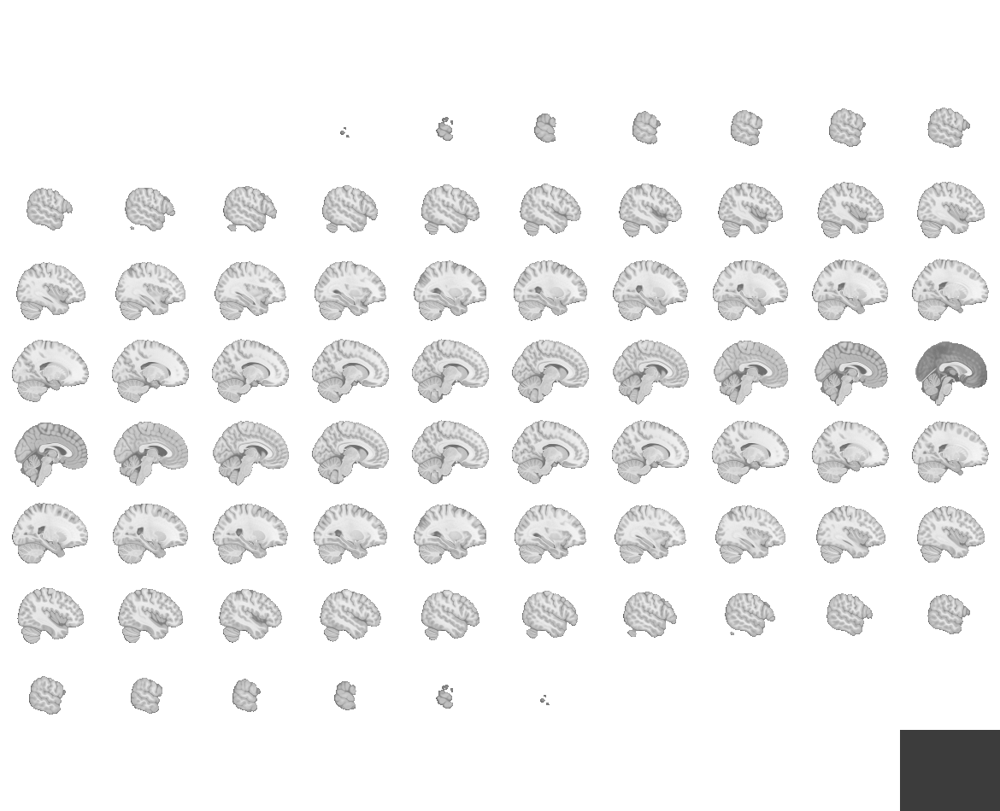
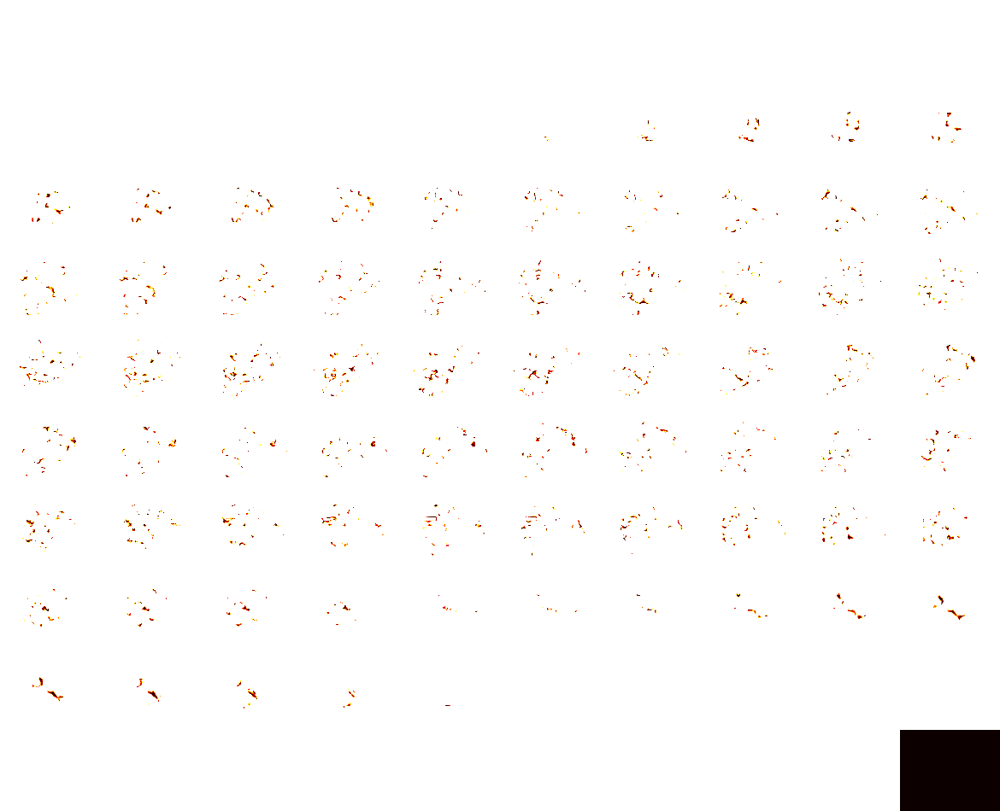

In [17]:
c=4
view = plotting.view_img(pval_activation_map_nii_list[c-1] , 
        title = f'{list(cond.values())[c-1]}',
        black_bg= False)
view


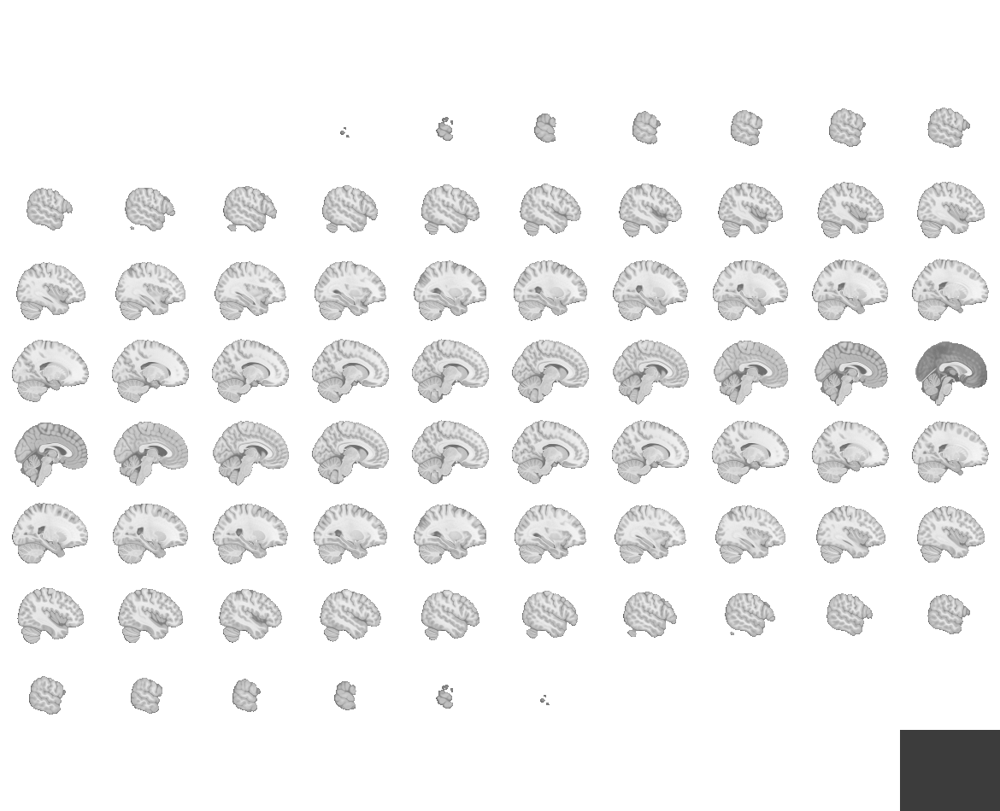
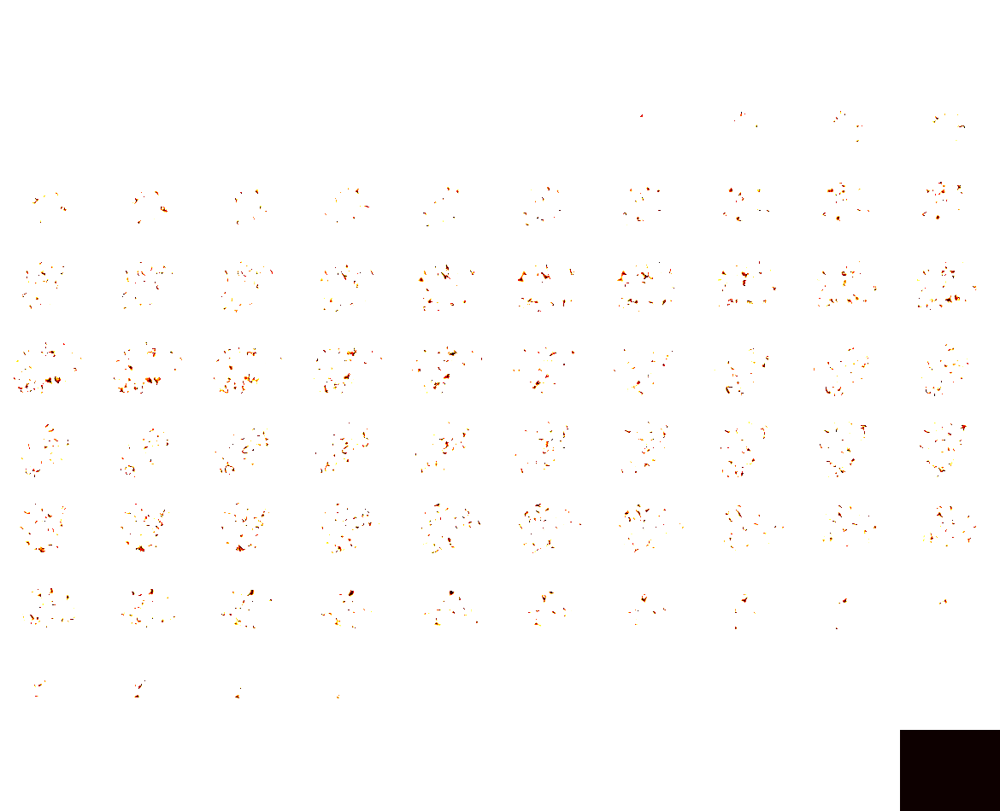

In [18]:
c=7
view = plotting.view_img(pval_activation_map_nii_list[c-1] , 
        title = f'{list(cond.values())[c-1]}',
        black_bg= False)
view

### T-stat

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



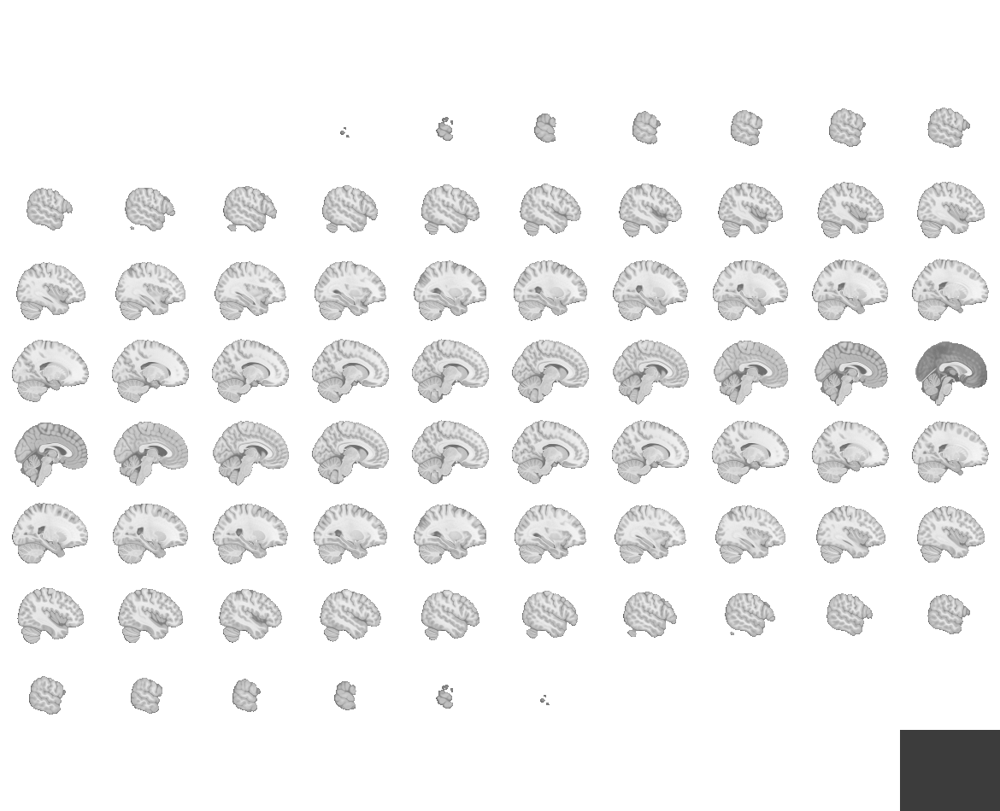
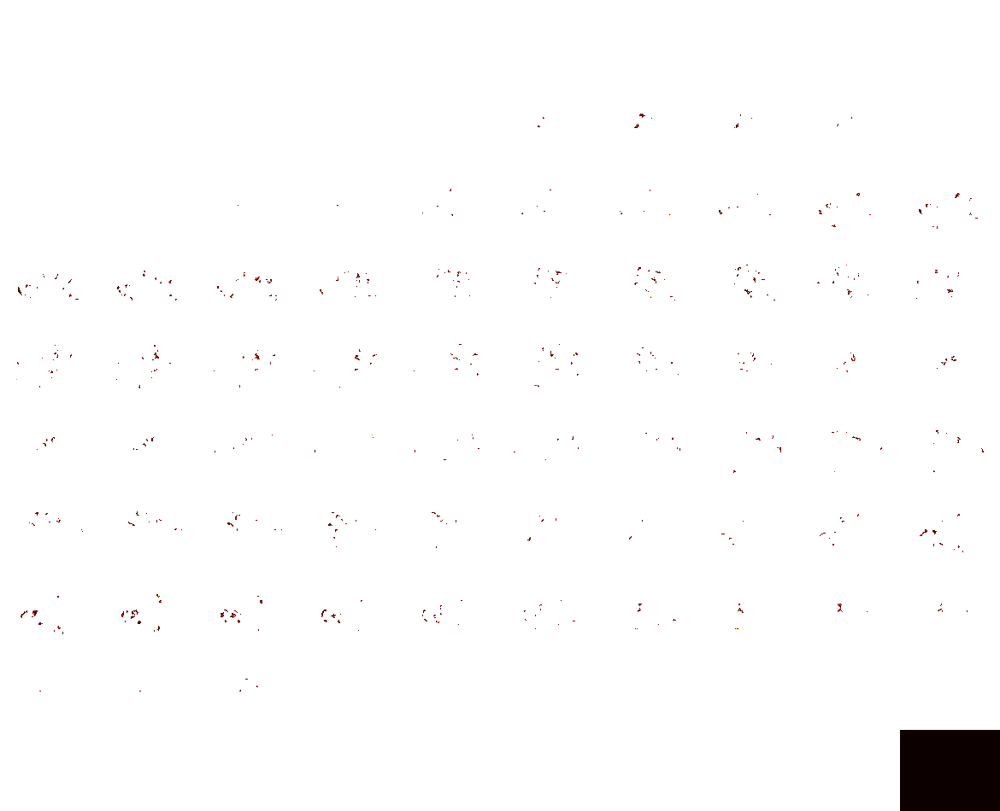

In [81]:
c=6

view = plotting.view_img(activation_map_nii_list[c-1] , 
        title = f'{list(cond.values())[c-1]}',
        black_bg= False,
        draw_cross = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



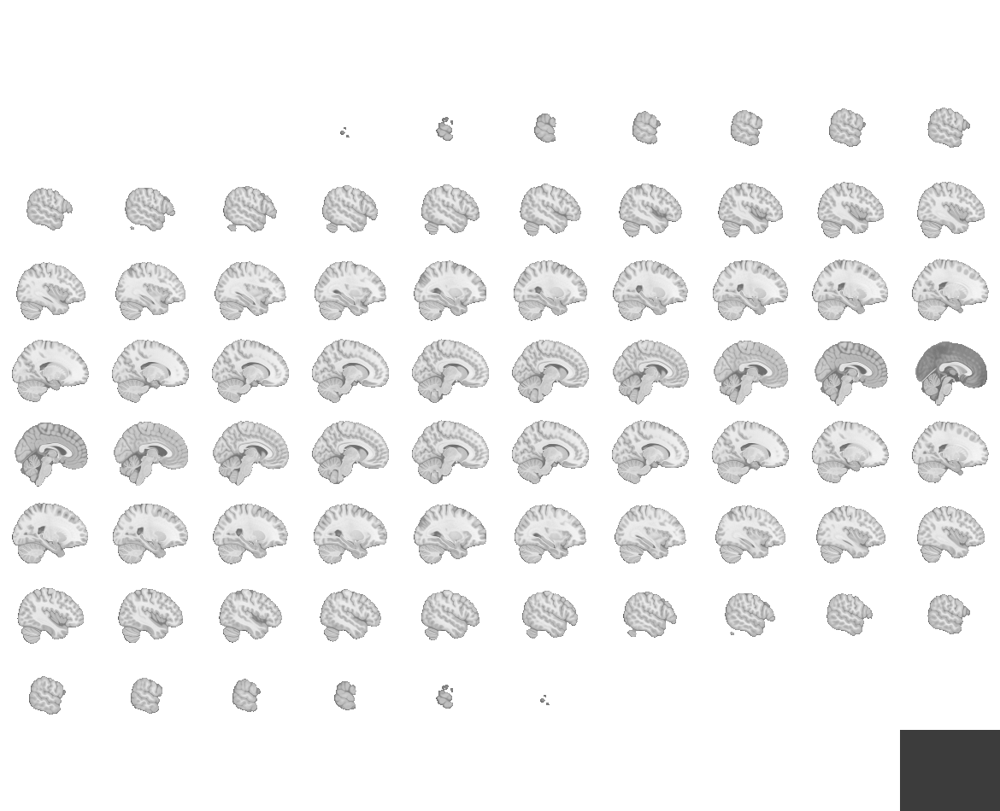
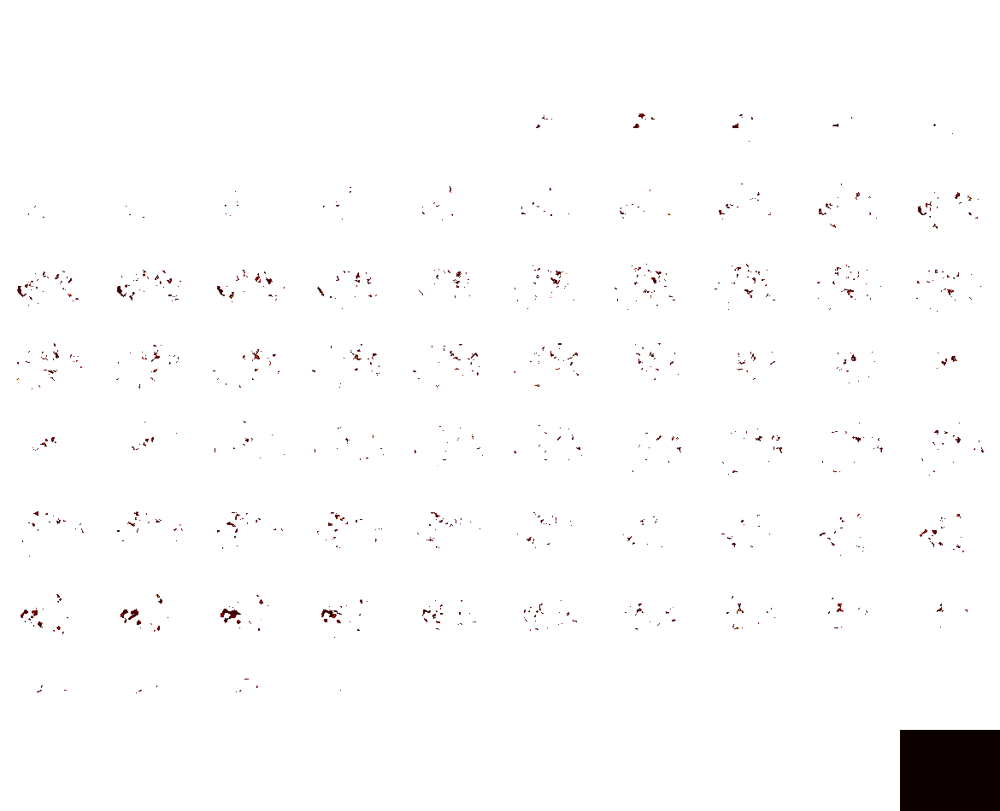

In [43]:
c=6

view = plotting.view_img(activation_maps_old[c-1] , 
        title = f'{list(cond.values())[c-1]}',
        black_bg= False,
        draw_cross = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



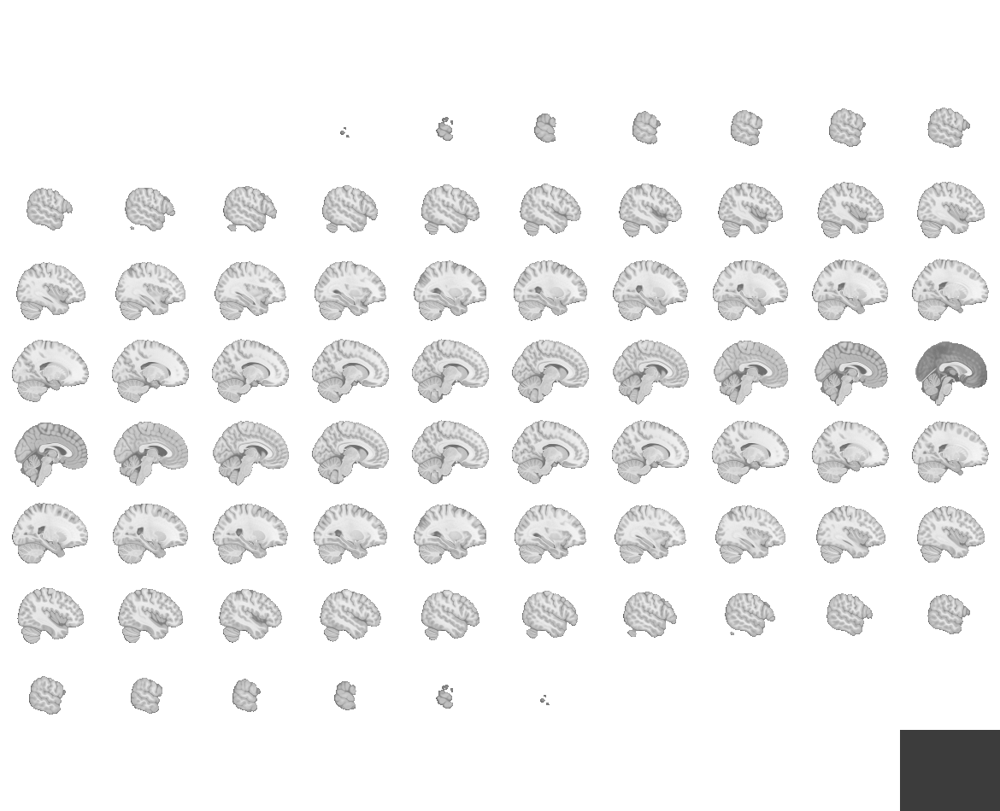
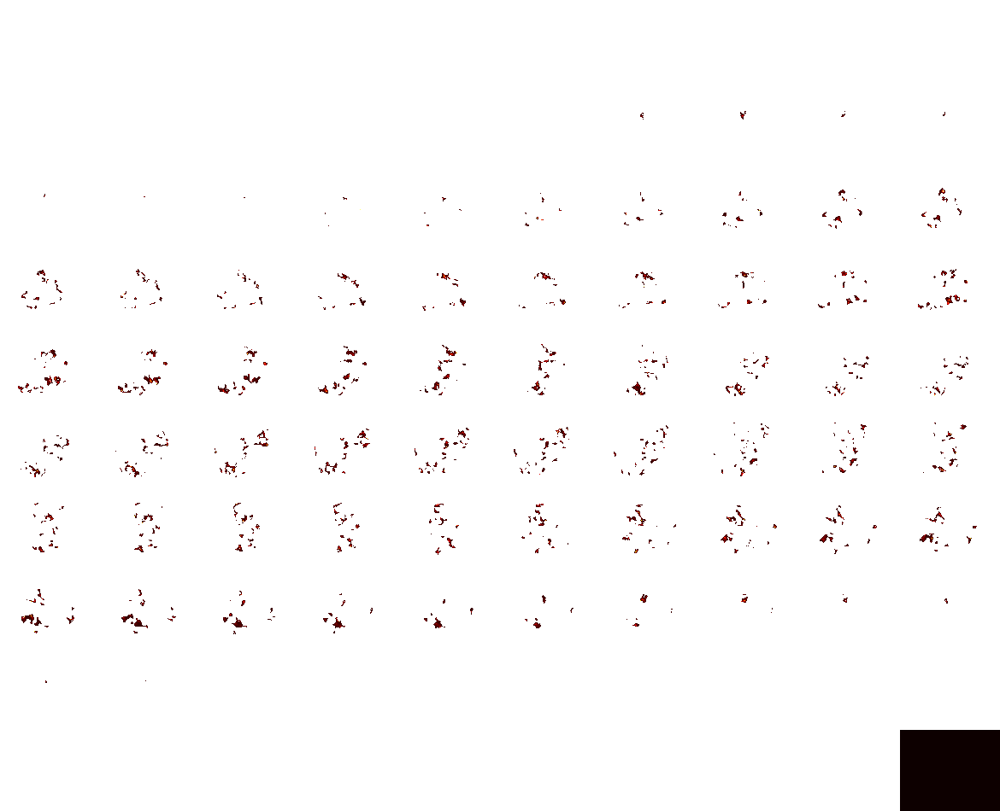

In [111]:
c=7

view = plotting.view_img(activation_maps_old_cluster_thrsh[c-1] , 
        title = f'{list(cond.values())[c-1]}',
        black_bg= False,
        draw_cross = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



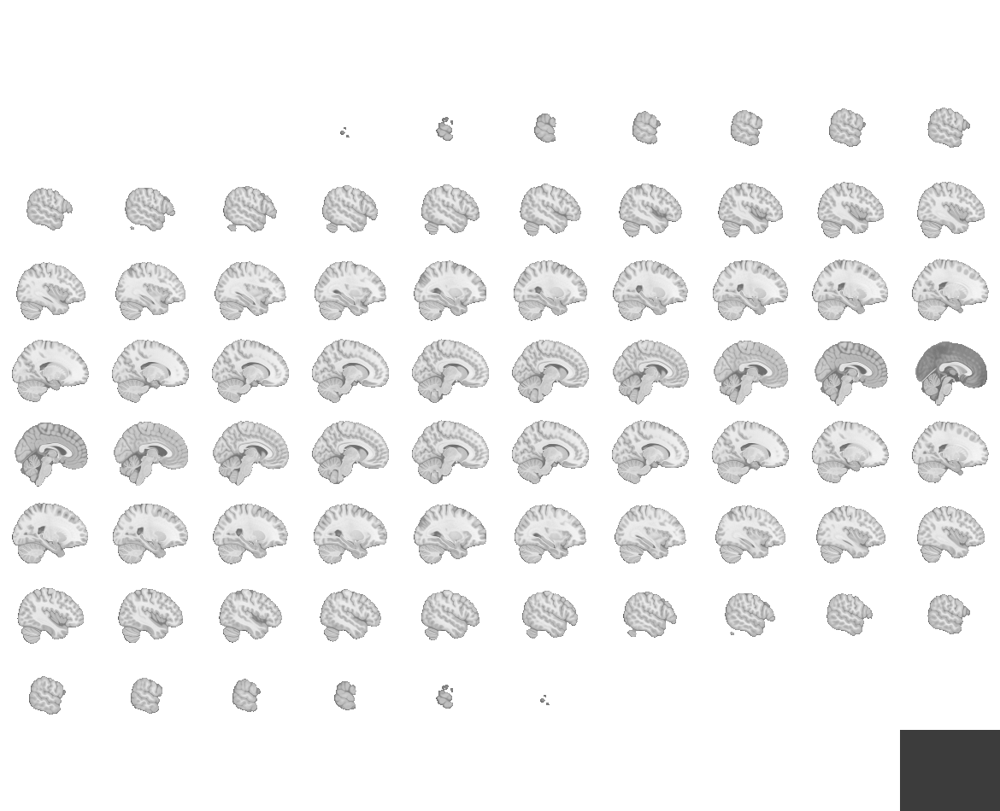
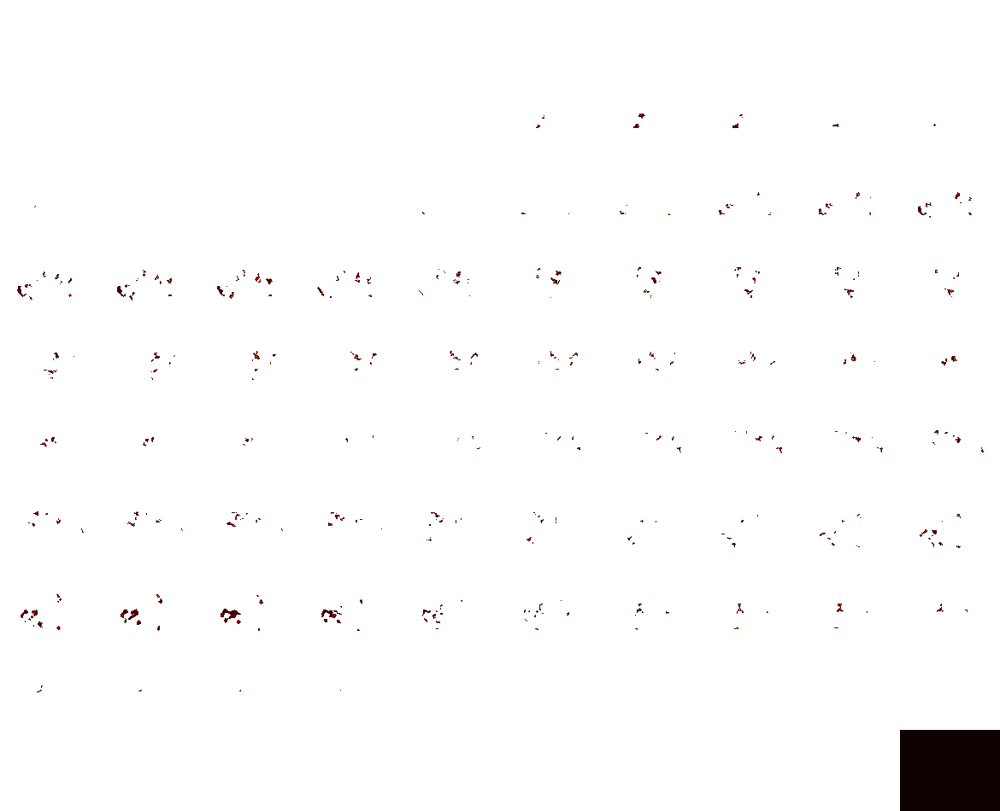

In [105]:
c=6

view = plotting.view_img(activation_maps_old_cluster_thrsh[c-1] , 
        title = f'{list(cond.values())[c-1]}',
        black_bg= False,
        draw_cross = False)
view

In [59]:
group1 = np.array([1.25, 1.2, 1.2, 1.2, 1.2])  # Small sample

# Perform a one-sample t-test against the value 0
t, p = stats.ttest_1samp(group1, popmean=0)

print(f"T-statistic: {t:.2f}")
print(f"P-value: {p:.4f}")

T-statistic: 121.00
P-value: 0.0000
